# Trabajo Práctico 006 — Fotografía Digital

## Modulos que vamos a usar

- `pathlib.Path`: para trabajar con rutas de archivo.
- `cv2`: para leer imagenes y aplicar operaciones de procesamiento.
- `numpy`: para operar con arreglos y mascaras.
- `matplotlib.pyplot`: para comparar visualmente resultados.
- `pandas`: para construir la tabla final de comparacion.


In [1]:
# Importación de librerías a utilizar
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Definición de rutas de las carpetas de imagenes de entrada y salida
carpeta_imagenes_originales = Path("../001_imagenes/originales")
carpeta_imagenes_procesadas = Path("../001_imagenes/procesadas")

# Creación de la carpeta de salida si aún no existe
carpeta_imagenes_procesadas.mkdir(exist_ok=True)

print(f"Carpeta esperada para originales: {carpeta_imagenes_originales.resolve()}")
print(f"Carpeta esperada para resultados: {carpeta_imagenes_procesadas.resolve()}")


Carpeta esperada para originales: C:\Proyectos\rodriguez-carmen-pdi-1c-2026\006_fotografia_digital\001_imagenes\originales
Carpeta esperada para resultados: C:\Proyectos\rodriguez-carmen-pdi-1c-2026\006_fotografia_digital\001_imagenes\procesadas


## Funciones de apoyo



In [2]:
def cargar_rgb(ruta):
    """Carga una imagen a color y la devuelve en RGB."""
    imagen_bgr = cv2.imread(str(ruta), cv2.IMREAD_COLOR)

    if imagen_bgr is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")
    
    imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

    return imagen_rgb

def cargar_gris(ruta):
    """Carga una imagen en escala de grises."""
    imagen_gris = cv2.imread(str(ruta), cv2.IMREAD_GRAYSCALE)

    if imagen_gris is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")
    
    return imagen_gris

def mostrar_imagen(imagen, titulo="Imagen"):
    """Muestra una sola imagen con un titulo."""
    plt.figure(figsize=(7, 6), constrained_layout=True)

    mapa_de_color = None
    if imagen.ndim == 2:
        mapa_de_color = "gray"

    plt.imshow(imagen, cmap=mapa_de_color)
    plt.title(titulo, fontweight="bold", loc="left")
    plt.axis("off")
    plt.show()

def mostrar_comparacion(imagen_izquierda, imagen_derecha, titulo_izquierda, titulo_derecha):
    """Muestra una comparacion simple entre dos imagenes."""
    figura, ejes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    mapa_izquierda = None
    if imagen_izquierda.ndim == 2:
        mapa_izquierda = "gray"
    
    ejes[0].imshow(imagen_izquierda, cmap=mapa_izquierda)
    ejes[0].set_title(titulo_izquierda, fontweight="bold", loc="left")
    ejes[0].axis("off")

    mapa_derecha = None
    if imagen_derecha.ndim == 2:
        mapa_derecha = "gray"

    ejes[1].imshow(imagen_derecha, cmap=mapa_derecha)
    ejes[1].set_title(titulo_derecha, fontweight="bold", loc="left")
    ejes[1].axis("off")

    plt.show()

def mostrar_histograma_gris(imagen):
    """Muestra el histograma en grises de una imagen."""
    imagen_gris = imagen
    if imagen.ndim == 3:
        imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)

    histograma, bordes = np.histogram(imagen_gris.flatten(), bins=256, range=[0, 256])

    plt.figure(figsize=(10, 4), constrained_layout=True)
    plt.plot(bordes[:-1], histograma, color="black")
    plt.title("Histograma en escala de grises", fontweight="bold", loc="left")
    plt.xlabel("Intensidad")
    plt.ylabel("Cantidad de pixeles")
    plt.xlim(0, 255)
    plt.grid(alpha=0.3)
    plt.show()

def mostrar_canales_rgb(imagen_rgb):
    """Muestra la imagen color y sus tres canales por separado."""
    canal_rojo = imagen_rgb[:, :, 0]
    canal_verde = imagen_rgb[:, :, 1]
    canal_azul = imagen_rgb[:, :, 2]

    figura, ejes = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)

    ejes[0, 0].imshow(imagen_rgb)
    ejes[0, 0].set_title("Imagen original", fontweight="bold", loc="left")
    ejes[0, 0].axis("off")

    ejes[0, 1].imshow(canal_rojo, cmap="gray")
    ejes[0, 1].set_title("Canal rojo", fontweight="bold", loc="left")
    ejes[0, 1].axis("off")

    ejes[1, 0].imshow(canal_verde, cmap="gray")
    ejes[1, 0].set_title("Canal verde", fontweight="bold", loc="left")
    ejes[1, 0].axis("off")

    ejes[1, 1].imshow(canal_azul, cmap="gray")
    ejes[1, 1].set_title("Canal azul", fontweight="bold", loc="left")
    ejes[1, 1].axis("off")

    plt.show()

def guardar_rgb(ruta_salida, imagen_rgb):
    """Guarda una imagen RGB en disco."""
    imagen_bgr = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(ruta_salida), imagen_bgr)

def guardar_gris(ruta_salida, imagen_gris):
    """Guarda una imagen en escala de grises."""
    cv2.imwrite(str(ruta_salida), imagen_gris)


## Parte 1: Captura con cámara oscura + ecualización HSV

1.	convertir la imagen a HSV,
2.	separar canales H, S y V,
3.	ecualizar únicamente el canal V,
4.	recomponer la imagen.

La diapositiva debe incluir

●	imagen original

●	imagen ecualizada

●	histograma antes/después

●	explicación breve de los cambios.

Preguntas guía
●	¿Qué mejoró visualmente?

●	¿Qué información se perdió?

●	¿Qué limitaciones tiene la cámara oscura?

●	¿Por qué se ecualiza el canal V y no RGB directamente?



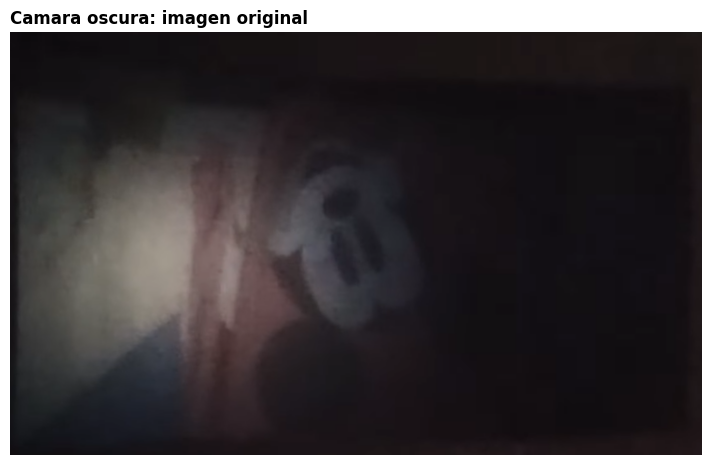

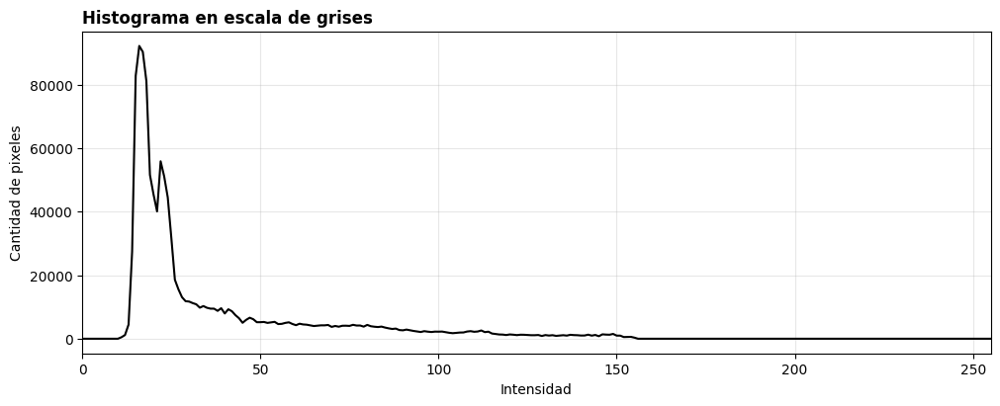

Diagnostico inicial: Imagen muy oscura, bajo contraste, iluminación despareja, poca nitidez, posible orientación/inversión, mucha zona sin información útil.
Primera hipotesis: Corregir orientación, recortar la región útil, ajuste lineal de brillo y contraste


In [3]:
nombre_imagen_camara_oscura = "Mickey_000.png"

# Inicializamos la variable de imagen
imagen_camara_oscura_rgb = None

# Cargamos la imagen
if nombre_imagen_camara_oscura != "":
    ruta_camara_oscura = carpeta_imagenes_originales / "Mickey_000.png"
    imagen_camara_oscura_rgb = cargar_rgb(ruta_camara_oscura)

    # Mostramos la imagen original y su histograma para empezar el diagnostico.
    mostrar_imagen(imagen_camara_oscura_rgb, "Camara oscura: imagen original")
    mostrar_histograma_gris(imagen_camara_oscura_rgb)



# Detallamos diagnóstico inicial
diagnostico_camara_oscura = "Imagen muy oscura, bajo contraste, iluminación despareja, poca nitidez, posible orientación/inversión, mucha zona sin información útil."

# Primera hipotesis de mejora
hipotesis_camara_oscura = "Corregir orientación, recortar la región útil, ajuste lineal de brillo y contraste"

print("Diagnostico inicial:", diagnostico_camara_oscura)
print("Primera hipotesis:", hipotesis_camara_oscura)


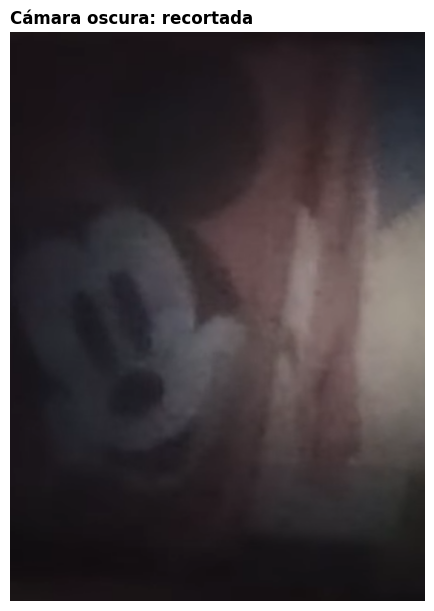

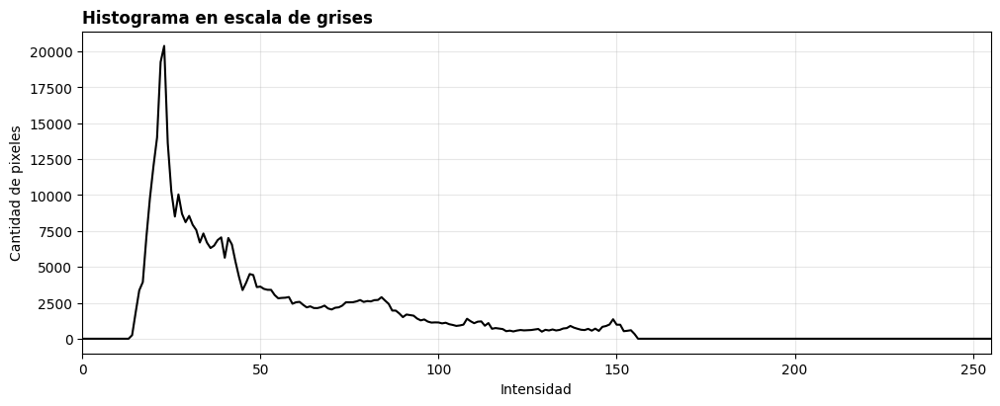

In [4]:
# Voltear la imagen 180° para verla al derecho (cámara oscura invierte la proyección)
imagen_camara_oscura_rgb = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)



# Recortar la región útil para eliminar los bordes demasiado oscuros
alto, ancho = imagen_camara_oscura_rgb.shape[:2]

# Ajustá estos valores según dónde estén las zonas oscuras en tu imagen
margen_arriba    = int(alto  * 0.02)   # recorta 8% desde arriba
margen_abajo     = int(alto  * 0.92)   # conserva hasta el 92% de la altura
margen_izquierda = int(ancho * 0.40)   # recorta 10% desde la izquierda
margen_derecha   = int(ancho * 0.80)   # conserva hasta el 95% del ancho

imagen_camara_oscura_rgb = imagen_camara_oscura_rgb[
    margen_arriba:margen_abajo,
    margen_izquierda:margen_derecha
]

# Verificar el resultado del recorte
mostrar_imagen(imagen_camara_oscura_rgb, "Cámara oscura: recortada")
mostrar_histograma_gris(imagen_camara_oscura_rgb)

guardar_rgb(carpeta_imagenes_procesadas / "caso1_camara_oscura_recortada.png", imagen_camara_oscura_rgb)


In [5]:
# Leemos la imagen principal desde la carpeta del proyecto.
# Se vuelve a leer aquí en formato BGR para verificar que el archivo sea accesible
# y para exponer el tipo de dato nativo de OpenCV antes de cualquier conversión.
imagen_bgr = cv2.imread(str(ruta_camara_oscura))

# Verificamos que el archivo se haya cargado correctamente.
if imagen_bgr is None:
    raise FileNotFoundError(f'No se pudo leer la imagen: {ruta_camara_oscura}')

# Esta conversión ya fue realizada por cargar_rgb() en la celda de carga inicial.
# Se deja comentada porque imagen_camara_oscura_rgb ya incluye la rotación y el recorte aplicados.
#imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

# Mostramos información básica para reconocer la estructura del arreglo.
# shape devuelve (alto, ancho, canales); dtype uint8 indica que los valores van de 0 a 255.
print(f'Dimensiones de la imagen: {imagen_camara_oscura_rgb.shape}')
print(f'Tipo de dato: {imagen_camara_oscura_rgb.dtype}')

Dimensiones de la imagen: (770, 560, 3)
Tipo de dato: uint8


### ¿Por qué convertir a HSV en lugar de trabajar directamente en RGB?

En RGB, los tres canales (R, G, B) mezclan información de **color y brillo** de forma acoplada. Si ecualizamos cada canal por separado, alteramos el balance de color y obtenemos tonos artificiales.

HSV separa esa información en tres componentes independientes:
- **H (Hue / Tono):** de qué color es cada píxel (rango 0–179 en OpenCV).
- **S (Saturation / Saturación):** qué tan vívido es ese color.
- **V (Value / Valor):** qué tan brillante es, independientemente del color.

Esto permite intervenir **solo el brillo** (canal V) sin tocar el color original de la imagen.

In [6]:
# Convertimos la imagen RGB al espacio de color HSV.
imagen_hsv = cv2.cvtColor(imagen_camara_oscura_rgb, cv2.COLOR_RGB2HSV)

# Mostramos algunos valores para recordar que HSV también es una representación numérica.
print(f'Dimensiones de la imagen en HSV: {imagen_hsv.shape}')
print(f'Rango del canal H: {imagen_hsv[:, :, 0].min()} a {imagen_hsv[:, :, 0].max()}')

Dimensiones de la imagen en HSV: (770, 560, 3)
Rango del canal H: 0 a 179


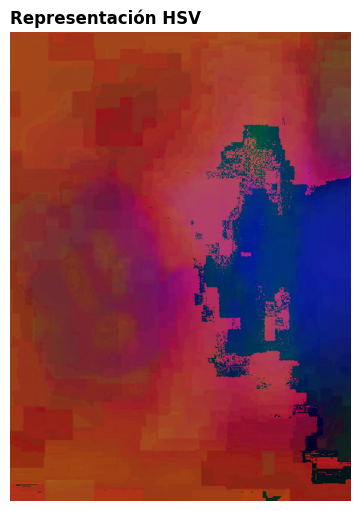

In [7]:
# Visualizamos la imagen HSV.
# El resultado no se ve natural porque Matplotlib interpreta los datos como si fueran RGB.
# Los valores de H (0–179), S (0–255) y V (0–255) se mapean sobre R, G y B respectivamente,
# produciendo colores sin significado visual directo. Esto es normal y esperado.
plt.figure(figsize=(10, 5), constrained_layout=True)
plt.imshow(imagen_hsv)
plt.title('Representación HSV', fontweight='bold', loc='left')
plt.axis('off')
plt.show()

**¿Por qué la imagen se ve con colores extraños?**  
Matplotlib siempre interpreta los datos como si fueran RGB. Como la imagen está en HSV, los valores numéricos de H, S y V se mapean sobre los canales R, G y B, produciendo una representación visual incorrecta. Esto es normal y esperado: la conversión a HSV es una operación matemática, no un cambio en cómo se "ve" la imagen directamente.

### ¿Qué muestra cada canal?

- **Canal H (Tono):** codifica el color dominante de cada zona (0 = rojo, 60 = amarillo, 120 = verde, 179 = rojo nuevamente). En una imagen oscura de cámara oscura, este canal suele tener poca variación significativa.
- **Canal S (Saturación):** muestra qué tan vívidos son los colores. Una imagen oscura tiende a tener saturación baja, por eso este canal suele aparecer casi negro.
- **Canal V (Valor / Brillo):** representa la luminosidad de cada píxel. Es el canal que concentra el problema principal de la cámara oscura: **bajo contraste y oscuridad general**. Es sobre este canal que conviene intervenir.

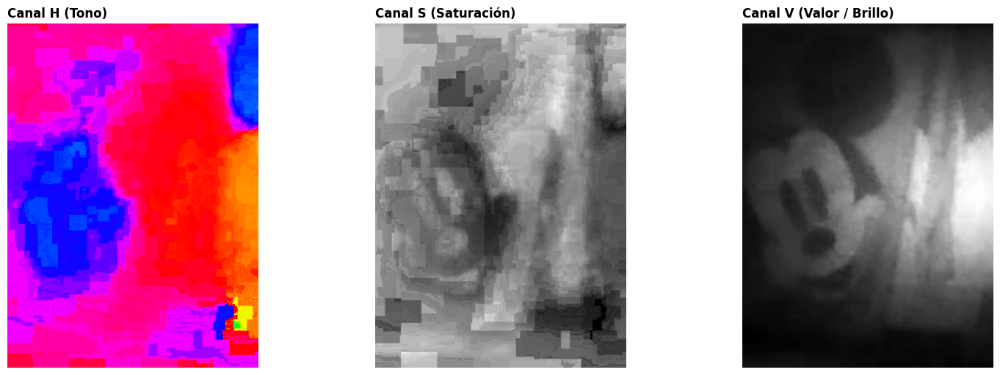

In [8]:
# Convertir la imagen RGB a HSV
imagen_hsv = cv2.cvtColor(imagen_camara_oscura_rgb, cv2.COLOR_RGB2HSV)

# cv2.split descompone el arreglo 3D (alto, ancho, 3) en tres matrices 2D independientes (alto, ancho)
canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

# Visualizar los tres canales por separado
# cmap="hsv": asocia cada valor numérico de H con su color perceptual (0=rojo, 60=amarillo, 120=verde)
# cmap="gray": representa la magnitud de S y V como nivel de gris (0=negro, 255=blanco)
figura, ejes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

ejes[0].imshow(canal_h, cmap="hsv")
ejes[0].set_title("Canal H (Tono)", fontweight="bold", loc="left")
ejes[0].axis("off")

ejes[1].imshow(canal_s, cmap="gray")
ejes[1].set_title("Canal S (Saturación)", fontweight="bold", loc="left")
ejes[1].axis("off")

ejes[2].imshow(canal_v, cmap="gray")
ejes[2].set_title("Canal V (Valor / Brillo)", fontweight="bold", loc="left")
ejes[2].axis("off")

plt.show()

### Ecualización del canal V — Mejora de brillo y contraste

`cv2.equalizeHist` redistribuye los valores de intensidad para que ocupen todo el rango disponible (0–255). Al aplicarlo sobre el canal V, aumentamos el contraste de la imagen **sin alterar los colores**, porque H y S permanecen intactos. Luego recomponemos la imagen con `cv2.merge` y convertimos de vuelta a RGB para poder visualizarla correctamente.

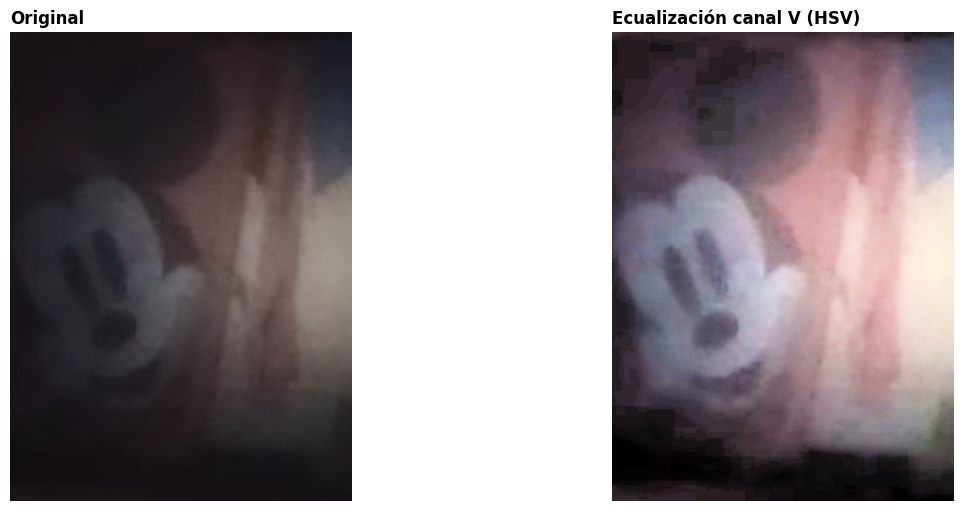

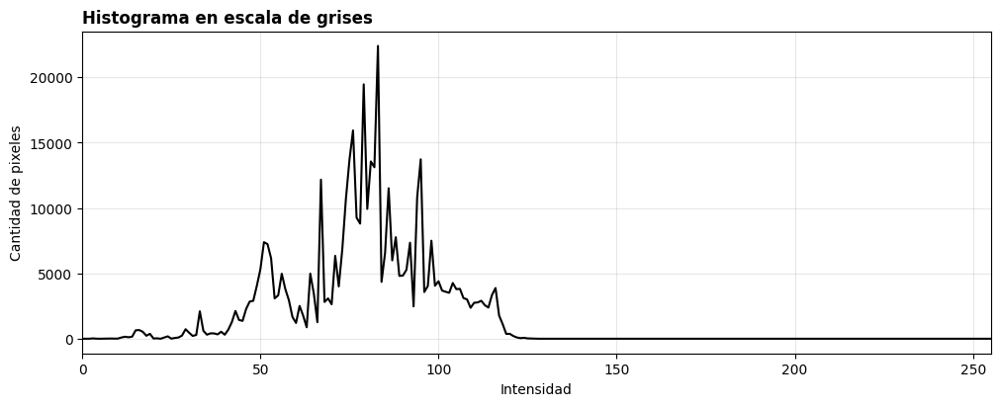

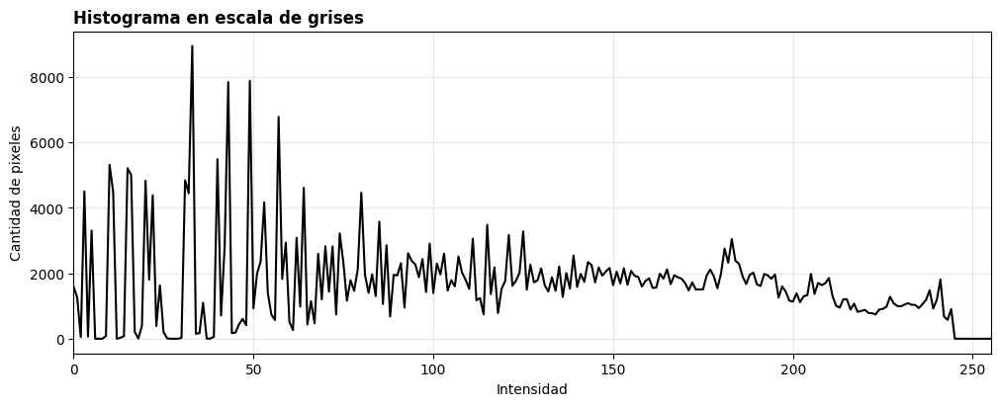

In [9]:
# equalizeHist redistribuye los valores de brillo para que ocupen todo el rango 0–255.
# Solo se aplica al canal V para no alterar el color (H y S permanecen intactos).
canal_v_ecualizado = cv2.equalizeHist(canal_v)

# cv2.merge recompone los tres canales 2D en un arreglo 3D con el mismo orden que el original
imagen_hsv_ecualizada = cv2.merge([canal_h, canal_s, canal_v_ecualizado])

# Convertir de vuelta a RGB para visualizar correctamente con Matplotlib
imagen_v_ecualizada_rgb = cv2.cvtColor(imagen_hsv_ecualizada, cv2.COLOR_HSV2RGB)

# Comparar resultado
mostrar_comparacion(
    imagen_camara_oscura_rgb,
    imagen_v_ecualizada_rgb,
    "Original",
    "Ecualización canal V (HSV)"
)
# Histograma de la imagen en espacio HSV (valores numéricos de los canales, no perceptuales)
mostrar_histograma_gris(imagen_hsv_ecualizada)
# Histograma de la imagen convertida a RGB (refleja la distribución visual real tras la ecualización)
mostrar_histograma_gris(imagen_v_ecualizada_rgb)

guardar_rgb(carpeta_imagenes_procesadas / "caso1_ecualizacion_canal_v.png", imagen_v_ecualizada_rgb)

### Análisis del resultado — Ecualización canal V

**¿Qué mejoró visualmente?**  
La ecualización redistribuye los valores de brillo para que ocupen todo el rango (0–255). Las zonas que antes eran oscuras y difíciles de leer ganan contraste y se vuelven más legibles. Los colores se mantienen, porque H y S no fueron modificados.

**¿Qué información se perdió?**  
En zonas donde la imagen original era muy oscura, los detalles eran escasos o inexistentes. La ecualización amplifica lo que hay, pero **no crea información nueva**. También puede amplificar el ruido presente en la captura original, haciéndolo más visible.

**¿Por qué se ecualiza el canal V y no RGB directamente?**  
Ecualizar los canales R, G y B por separado los modifica de forma diferente, rompiendo el balance cromático y produciendo tonos artificiales (verdosos, rojizos, etc.). Al actuar solo sobre V, se redistribuye el brillo manteniendo H y S intactos: **los colores permanecen iguales, solo cambia la luminosidad**.

**¿Qué limitaciones tiene la cámara oscura?**  
La cámara oscura proyecta la imagen invertida, con poca luz y sin lente. Esto produce imágenes oscuras, con bajo contraste y sin nitidez. El procesamiento digital puede mejorar el contraste, pero **no puede recuperar detalles que no fueron registrados en la captura original**. La calidad del resultado siempre está acotada por las condiciones de la toma.

Recomposición

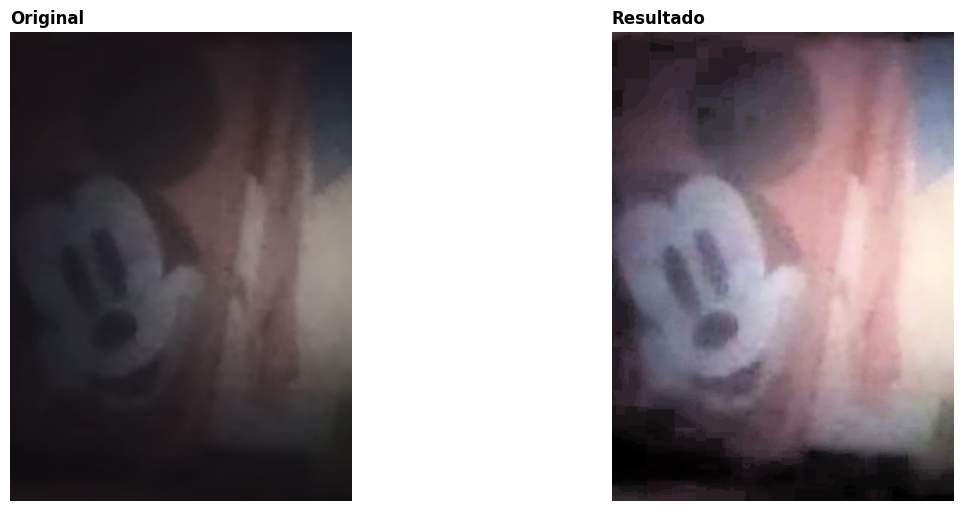

In [10]:
# Celda de resumen: muestra el pipeline completo separación → modificación → recomposición.
# Es equivalente a las celdas anteriores y se incluye aquí para claridad didáctica del flujo.

# Separación
imagen_hsv = cv2.cvtColor(imagen_camara_oscura_rgb, cv2.COLOR_RGB2HSV)
canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

# Modificación (por ejemplo, ecualizar V)
canal_v_ecualizado = cv2.equalizeHist(canal_v)

# Recomposición  ← acá va
imagen_hsv_recompuesta = cv2.merge([canal_h, canal_s, canal_v_ecualizado])
imagen_recompuesta_rgb = cv2.cvtColor(imagen_hsv_recompuesta, cv2.COLOR_HSV2RGB)

# Visualización o guardado
mostrar_comparacion(imagen_camara_oscura_rgb, imagen_recompuesta_rgb, "Original", "Resultado")

### Ecualización del canal H — Comparativa (solo análisis)

El canal H codifica el tono (el "nombre" del color). Ecualizarlo redistribuye los tonos disponibles en todo el rango (0–179), lo que **distorsiona los colores de manera arbitraria**: los objetos cambian de color sin justificación perceptiva. Este resultado es útil para observar la distribución de tonos, pero **no es una estrategia válida para mejorar la imagen**.

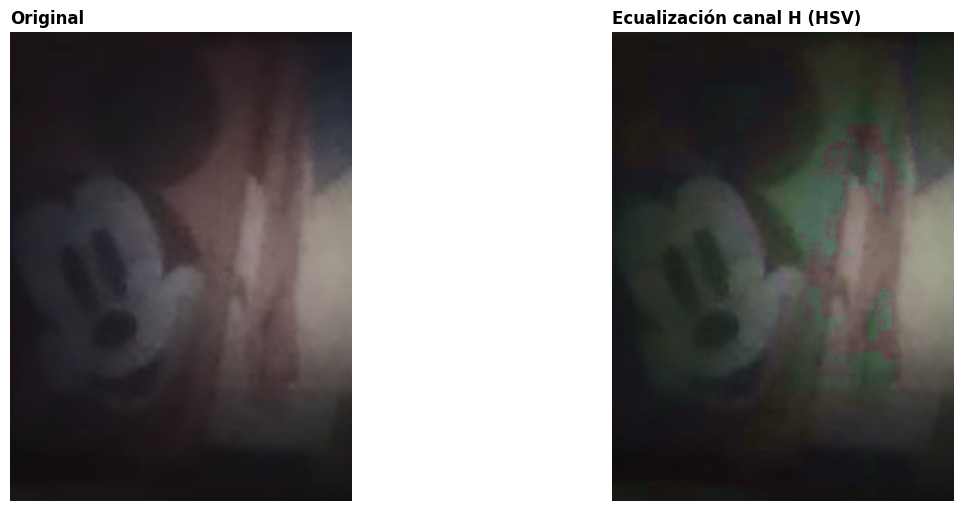

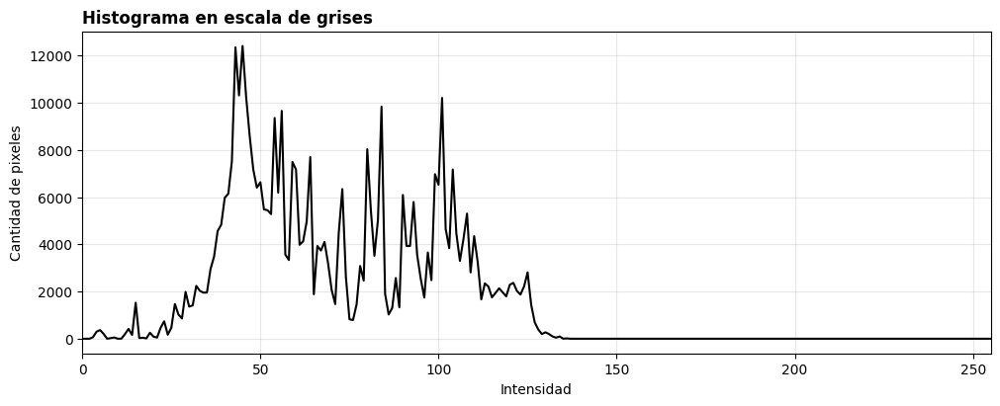

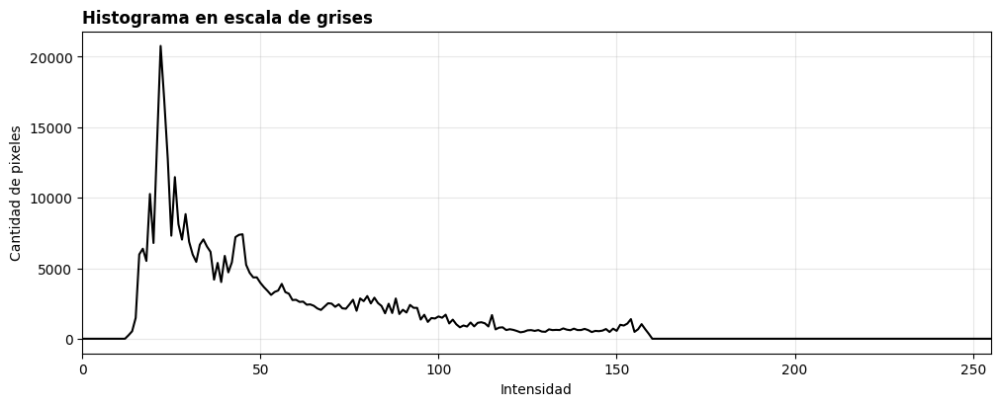

In [11]:
# Ecualizar únicamente el canal H
# Esto redistribuye los valores de tono en todo el rango disponible (0–179),
# distorsionando los colores de forma arbitraria. Solo tiene valor analítico comparativo.
canal_h_ecualizado = cv2.equalizeHist(canal_h)

# Reconstruir la imagen HSV con el canal H ecualizado
imagen_hsv_h_ecualizada = cv2.merge([canal_h_ecualizado, canal_s, canal_v])

# Convertir de vuelta a RGB para visualizar
imagen_h_ecualizada_rgb = cv2.cvtColor(imagen_hsv_h_ecualizada, cv2.COLOR_HSV2RGB)

# Comparar resultado
mostrar_comparacion(
    imagen_camara_oscura_rgb,
    imagen_h_ecualizada_rgb,
    "Original",
    "Ecualización canal H (HSV)"
)

mostrar_histograma_gris(imagen_hsv_h_ecualizada)
mostrar_histograma_gris(imagen_h_ecualizada_rgb)

guardar_rgb(carpeta_imagenes_procesadas / "caso1_ecualizacion_canal_h.png", imagen_h_ecualizada_rgb)

Recomposición

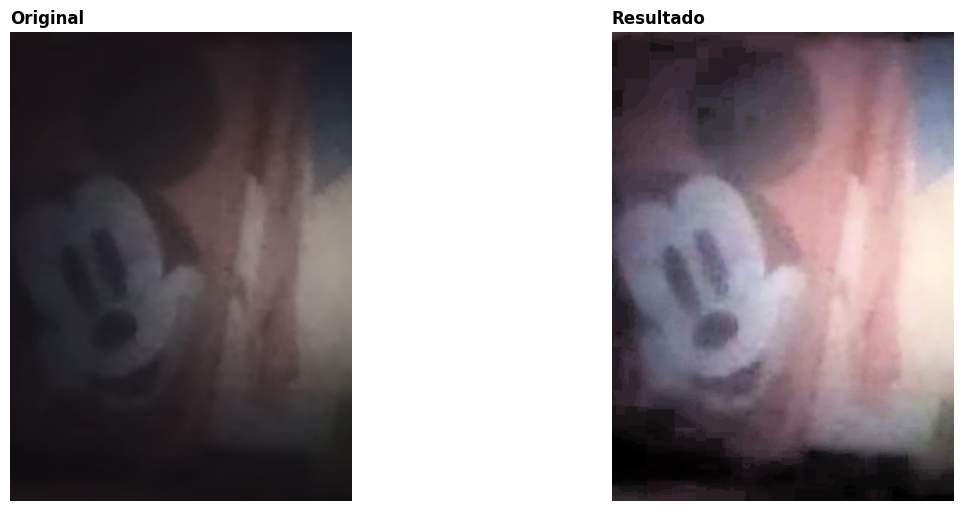

In [12]:
# Celda de resumen: repite el pipeline de separación → modificación → recomposición.
# Se incluye para mantener consistencia estructural con las celdas de canal H y canal S.

# Separación
imagen_hsv = cv2.cvtColor(imagen_camara_oscura_rgb, cv2.COLOR_RGB2HSV)
canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

# Modificación (por ejemplo, ecualizar V)
canal_v_ecualizado = cv2.equalizeHist(canal_v)

# Recomposición  ← acá va
imagen_hsv_recompuesta = cv2.merge([canal_h, canal_s, canal_v_ecualizado])
imagen_recompuesta_rgb = cv2.cvtColor(imagen_hsv_recompuesta, cv2.COLOR_HSV2RGB)

# Visualización o guardado
mostrar_comparacion(imagen_camara_oscura_rgb, imagen_recompuesta_rgb, "Original", "Resultado")

### Ecualización del canal S — Comparativa (solo análisis)

El canal S representa la viveza o intensidad del color. Ecualizarlo puede producir colores **excesivamente saturados** en zonas que originalmente tenían poco color, generando un resultado artificial. Para una mejora controlada de la saturación, es preferible un ajuste proporcional con `convertScaleAbs(canal_s, alpha=factor)`, que permite definir cuánto se incrementa sin redistribuir de forma radical.

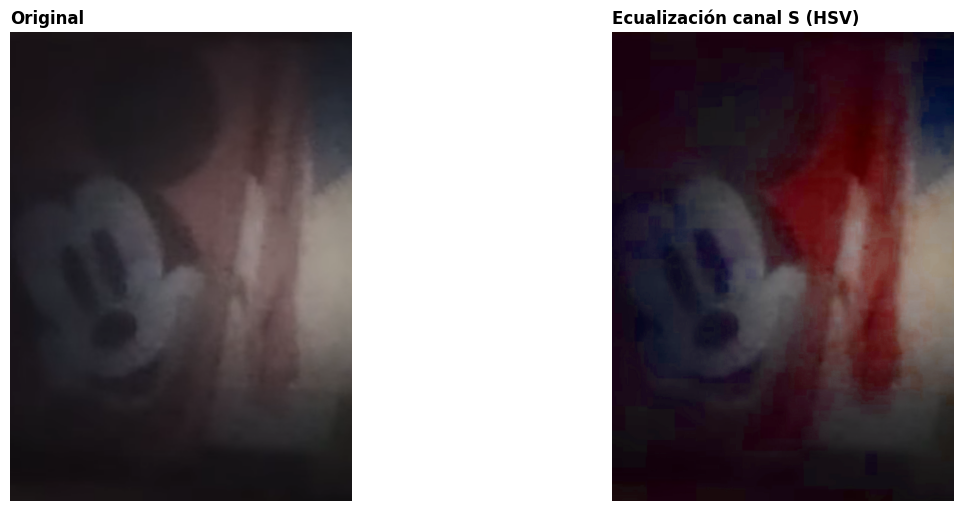

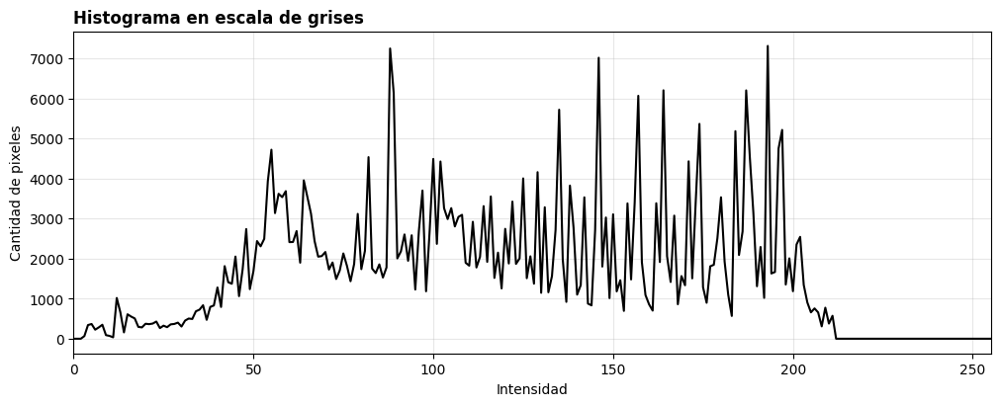

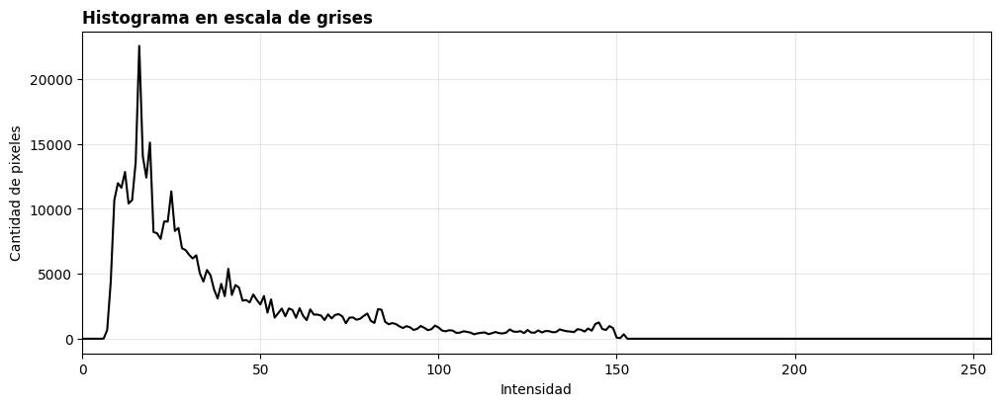

In [13]:
# Ecualizar únicamente el canal S
# Esto amplifica la saturación de todos los colores presentes,
# generando tonos excesivamente vívidos. Solo tiene valor analítico comparativo.
canal_s_ecualizado = cv2.equalizeHist(canal_s)

# Reconstruir la imagen HSV con el canal S ecualizado
imagen_hsv_s_ecualizada = cv2.merge([canal_h, canal_s_ecualizado, canal_v])

# Convertir de vuelta a RGB para visualizar
imagen_s_ecualizada_rgb = cv2.cvtColor(imagen_hsv_s_ecualizada, cv2.COLOR_HSV2RGB)

# Comparar resultado
mostrar_comparacion(
    imagen_camara_oscura_rgb,
    imagen_s_ecualizada_rgb,
    "Original",
    "Ecualización canal S (HSV)"
)
mostrar_histograma_gris(imagen_hsv_s_ecualizada)
mostrar_histograma_gris(imagen_s_ecualizada_rgb)

guardar_rgb(carpeta_imagenes_procesadas / "caso1_ecualizacion_canal_s.png", imagen_s_ecualizada_rgb)

Recomposición

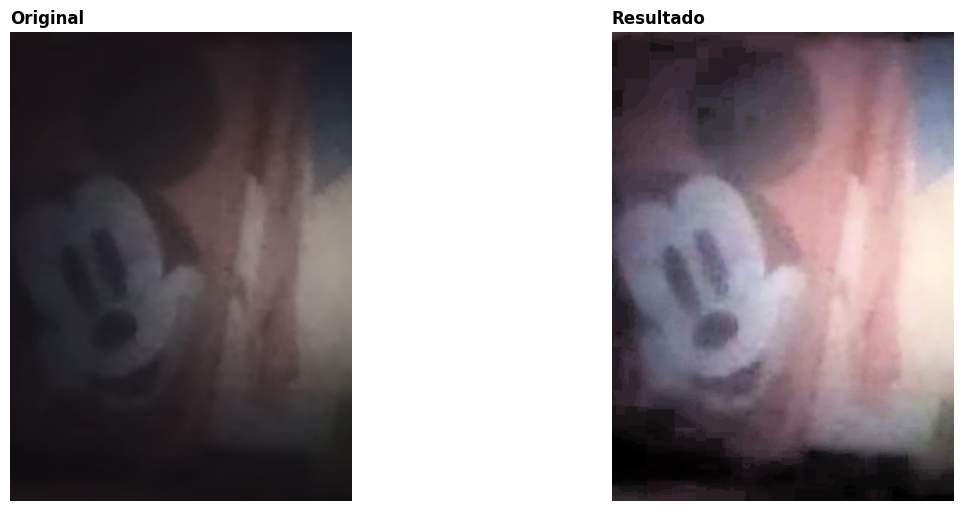

In [14]:
# Celda de resumen: repite el pipeline de separación → modificación → recomposición.
# Se incluye para mantener consistencia estructural con las celdas de canal H y canal V.

# Separación
imagen_hsv = cv2.cvtColor(imagen_camara_oscura_rgb, cv2.COLOR_RGB2HSV)
canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

# Modificación (por ejemplo, ecualizar V)
canal_v_ecualizado = cv2.equalizeHist(canal_v)

# Recomposición  ← acá va
imagen_hsv_recompuesta = cv2.merge([canal_h, canal_s, canal_v_ecualizado])
imagen_recompuesta_rgb = cv2.cvtColor(imagen_hsv_recompuesta, cv2.COLOR_HSV2RGB)

# Visualización o guardado
mostrar_comparacion(imagen_camara_oscura_rgb, imagen_recompuesta_rgb, "Original", "Resultado")

## Conclusión — Parte 1: Captura con cámara oscura

### ¿Qué es una cámara oscura y por qué produce imágenes degradadas?

La cámara oscura es un dispositivo que proyecta la escena exterior a través de un pequeño orificio sobre una superficie interna. Al no contar con lente, la imagen resultante llega con **poca luz, bajo contraste y orientación invertida** (arriba-abajo y derecha-izquierda). Estas limitaciones físicas no pueden corregirse completamente con procesamiento digital: lo que no fue capturado en la toma no puede reconstruirse.

---

### ¿Qué hicimos y por qué?

Aplicamos una **ecualización del histograma sobre el canal V del espacio de color HSV**.

El pipeline fue:
1. Corregir la orientación con una rotación de 180°.
2. Convertir la imagen de RGB a HSV.
3. Separar los canales H, S y V.
4. Ecualizar únicamente el canal V.
5. Recomponer la imagen y convertir de vuelta a RGB.

---

### ¿Por qué HSV y no RGB?

RGB mezcla color y brillo en los tres canales. Si se ecualiza cada canal por separado, los colores se alteran de forma desbalanceada y se obtienen tonos artificiales.

HSV separa el brillo (V) del color (H y S). Al intervenir solo sobre V, **el contraste mejora sin distorsionar los colores originales**.

---

### ¿Qué mejoró visualmente?

La ecualización redistribuye los valores de brillo para ocupar todo el rango disponible (0–255). Las zonas oscuras ganan contraste y se vuelven más legibles. Los colores se mantienen, porque H y S no fueron modificados.

### ¿Qué información se perdió?

La ecualización amplifica lo que ya existe en la imagen, pero **no crea información nueva**. En zonas muy oscuras donde los detalles eran casi inexistentes, el resultado sigue siendo limitado. Además, el ruido presente en la captura original puede volverse más visible.

---

### Limitaciones del método

- No se recupera la nitidez perdida en la toma original.
- No se puede reconstruir información que no fue registrada.
- La ecualización global actúa de manera uniforme: puede saturar zonas claras mientras mejora las oscuras.
- Para imágenes con iluminación muy irregular, CLAHE sobre el canal L (espacio LAB) daría resultados más controlados.


## Parte 2 — Composición y lenguaje visual

Objetivo
Construir una imagen donde el sujeto principal sea claramente identificable.
Requisitos
Aplicar al menos una de las siguientes estrategias:

●	separación sujeto/fondo,

●	reducción de ruido visual,

●	profundidad de campo,

●	espacio negativo,

●	acercamiento,

●	conversión a blanco y negro o escala de grises.

La diapositiva debe incluir

●	imagen original,

●	imagen final,

●	breve explicación compositiva.

Preguntas guía

●	¿Qué elementos distraían?

●	¿Qué se eliminó?

●	¿Cómo cambia la lectura en escala de grises?



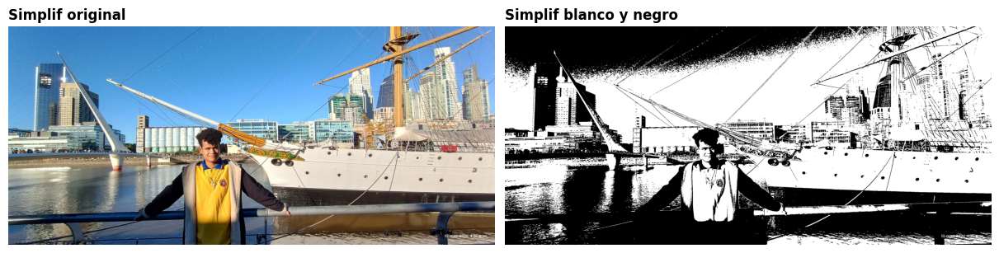

In [15]:
# Imagen original
ruta_simplif = carpeta_imagenes_originales / "Simplif.jpg"

# Cargar desde la imagen original
imagen_simplif_rgb = cargar_rgb(ruta_simplif)

# Convertir primero a escala de grises
imagen_simplif_gris = cv2.cvtColor(imagen_simplif_rgb, cv2.COLOR_RGB2GRAY)

# Umbral de Otsu: calcula automáticamente el valor de corte óptimo analizando el histograma.
# Minimiza la varianza intra-clase entre píxeles claros y oscuros.
# THRESH_BINARY asigna 255 a píxeles por encima del umbral y 0 a los que están por debajo.
# El primer valor de retorno (_) es el umbral calculado; el segundo es la imagen binaria.
_, imagen_simplif_bn = cv2.threshold(
    imagen_simplif_gris,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# Mostrar resultado
mostrar_comparacion(
    imagen_simplif_rgb,
    imagen_simplif_bn,
    "Simplif original",
    "Simplif blanco y negro"
)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simplif_blanco_y_negro.png",
    imagen_simplif_bn
)

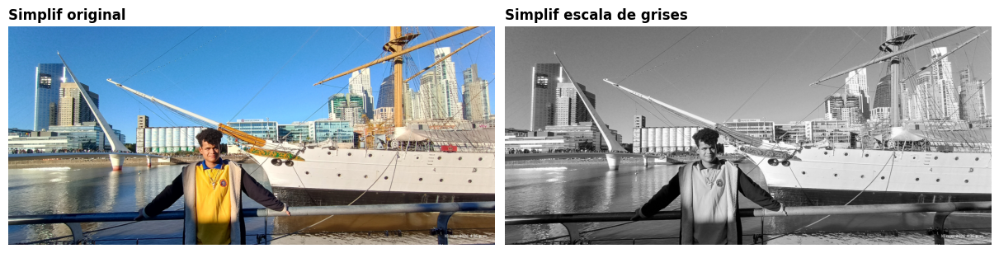

In [16]:
# Imagen original
ruta_simplif = carpeta_imagenes_originales / "Simplif.jpg"

# Cargar desde la imagen original
imagen_simplif_rgb = cargar_rgb(ruta_simplif)

# Convertir a escala de grises
imagen_simplif_gris = cv2.cvtColor(imagen_simplif_rgb, cv2.COLOR_RGB2GRAY)

# Mostrar resultado
mostrar_comparacion(
    imagen_simplif_rgb,
    imagen_simplif_gris,
    "Simplif original",
    "Simplif escala de grises"
)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simplif_escala_de_grises.png",
    imagen_simplif_gris
)


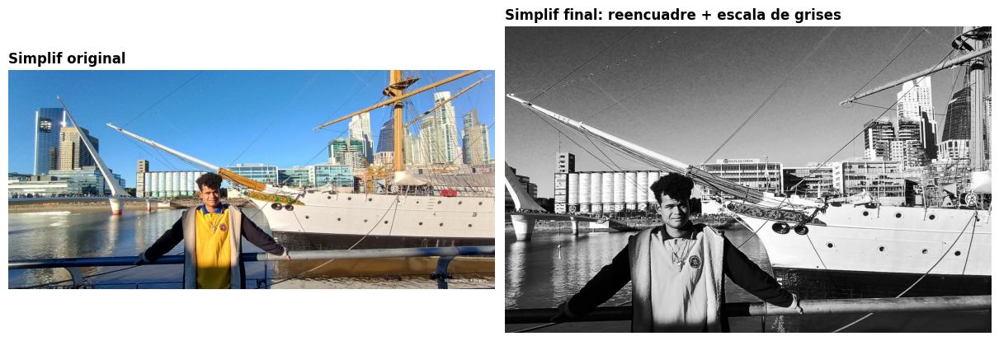

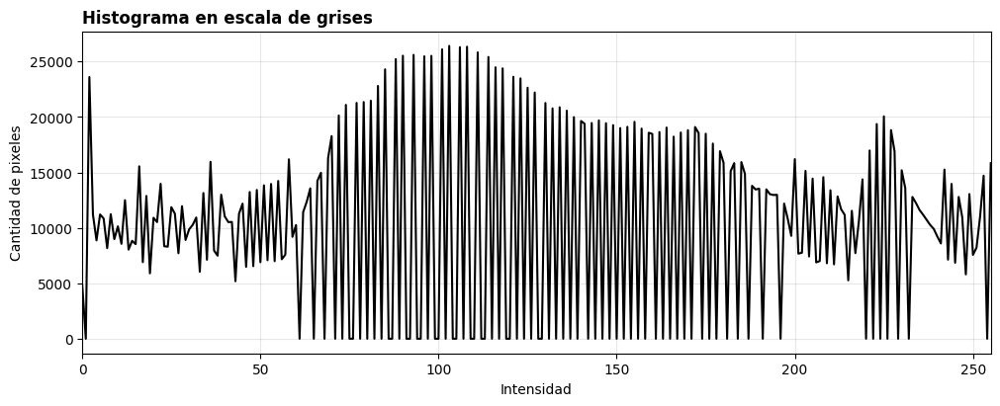

In [17]:
# Imagen original: Simplif
ruta_simplif = carpeta_imagenes_originales / "Simplif.jpg"

# Cargar imagen original en RGB
imagen_simplif_rgb = cargar_rgb(ruta_simplif)

# Reencuadre compositivo:
# Se recorta para acercar el sujeto principal y reducir elementos laterales.
alto, ancho = imagen_simplif_rgb.shape[:2]

x_inicio = int(ancho * 0.20)
x_fin    = int(ancho * 0.82)
y_inicio = int(alto * 0.05)
y_fin    = int(alto * 0.92)

imagen_simplif_reencuadrada = imagen_simplif_rgb[
    y_inicio:y_fin,
    x_inicio:x_fin
]

# Conversión a escala de grises
imagen_simplif_gris = cv2.cvtColor(
    imagen_simplif_reencuadrada,
    cv2.COLOR_RGB2GRAY
)

# Ecualización del histograma para reforzar la separación sujeto/fondo.
# Actúa sobre la imagen ya en grises: amplifica el contraste sin afectar información de color.
imagen_simplif_final = cv2.equalizeHist(imagen_simplif_gris)

# Mostrar comparación
mostrar_comparacion(
    imagen_simplif_rgb,
    imagen_simplif_final,
    "Simplif original",
    "Simplif final: reencuadre + escala de grises"
)

# Mostrar histograma del resultado final
mostrar_histograma_gris(imagen_simplif_final)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simplif_reencuadre_escala_grises.png",
    imagen_simplif_final
)

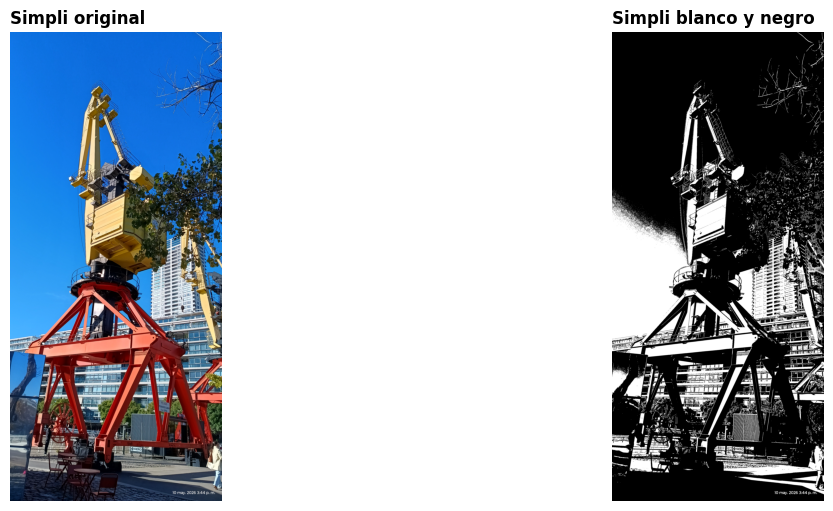

In [18]:
# Imagen original
ruta_simpli = carpeta_imagenes_originales / "Simpli.jpg"

# Cargar desde la imagen original
imagen_simpli_rgb = cargar_rgb(ruta_simpli)

# Convertir primero a escala de grises
imagen_simpli_gris = cv2.cvtColor(imagen_simpli_rgb, cv2.COLOR_RGB2GRAY)

# Umbral de Otsu: calcula automáticamente el valor de corte óptimo analizando el histograma.
# Minimiza la varianza intra-clase entre píxeles claros y oscuros.
# THRESH_BINARY asigna 255 a píxeles por encima del umbral y 0 a los que están por debajo.
# El primer valor de retorno (_) es el umbral calculado; el segundo es la imagen binaria.
_, imagen_simpli_bn = cv2.threshold(
    imagen_simpli_gris,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# Mostrar resultado
mostrar_comparacion(
    imagen_simpli_rgb,
    imagen_simpli_bn,
    "Simpli original",
    "Simpli blanco y negro"
)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simpli_blanco_y_negro.png",
    imagen_simpli_bn
)

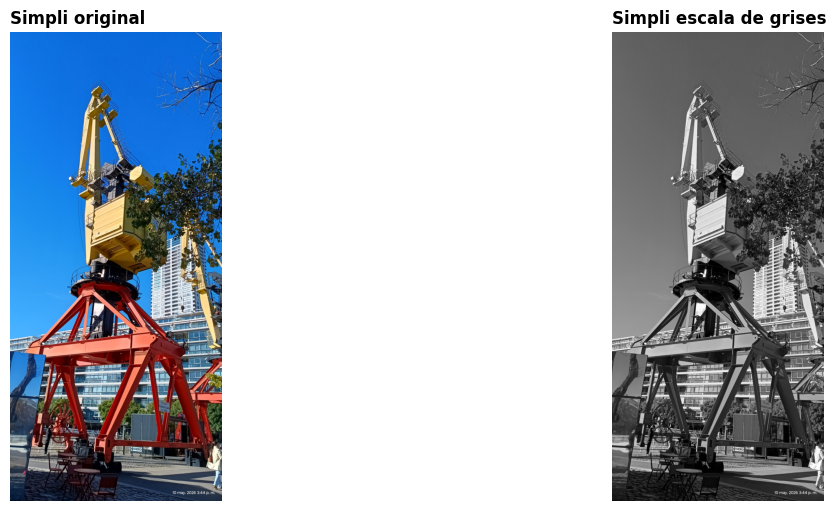

In [19]:
# Imagen original
ruta_simpli = carpeta_imagenes_originales / "Simpli.jpg"

# Cargar desde la imagen original
imagen_simpli_rgb = cargar_rgb(ruta_simpli)

# Convertir a escala de grises
imagen_simpli_gris = cv2.cvtColor(imagen_simpli_rgb, cv2.COLOR_RGB2GRAY)

# Mostrar resultado
mostrar_comparacion(
    imagen_simpli_rgb,
    imagen_simpli_gris,
    "Simpli original",
    "Simpli escala de grises"
)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simpli_escala_de_grises.png",
    imagen_simpli_gris
)


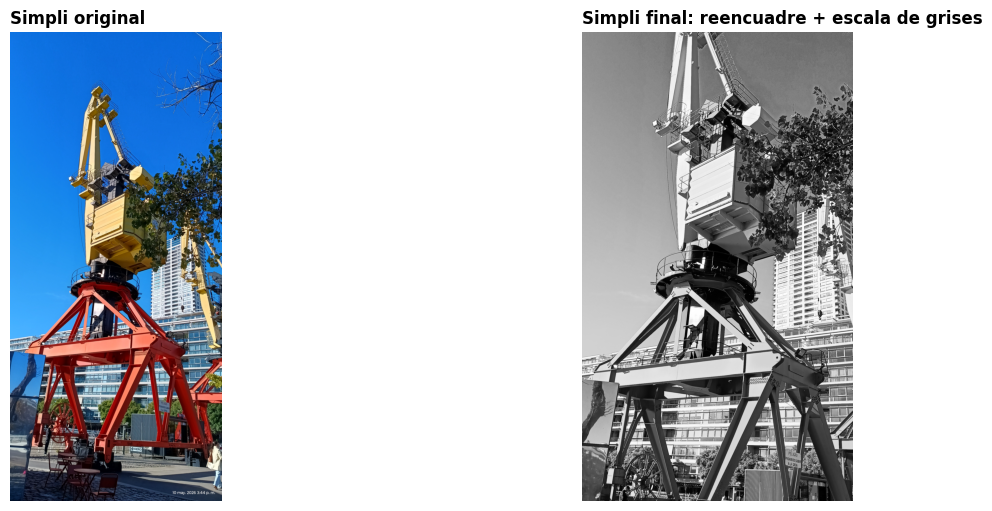

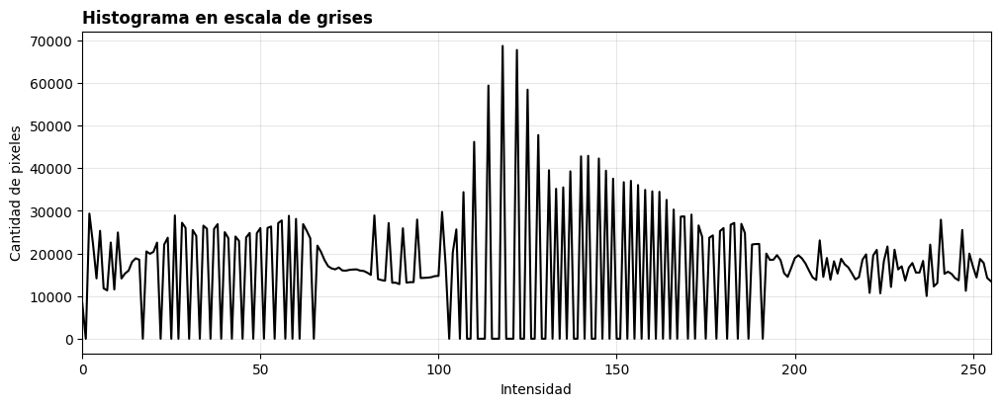

In [20]:
# Imagen original: Simpli
ruta_simpli = carpeta_imagenes_originales / "Simpli.jpg"

# Cargar imagen original en RGB
imagen_simpli_rgb = cargar_rgb(ruta_simpli)

# Reencuadre compositivo:
# Se reduce parte del cielo/zonas vacías y se elimina la fecha de la esquina inferior derecha.
alto, ancho = imagen_simpli_rgb.shape[:2]

x_inicio = int(ancho * 0.05)
x_fin    = int(ancho * 0.92)
y_inicio = int(alto * 0.18)
y_fin    = int(alto * 0.86)

imagen_simpli_reencuadrada = imagen_simpli_rgb[
    y_inicio:y_fin,
    x_inicio:x_fin
]

# Conversión a escala de grises
imagen_simpli_gris = cv2.cvtColor(
    imagen_simpli_reencuadrada,
    cv2.COLOR_RGB2GRAY
)

# Ecualización del histograma para reforzar luces y formas.
# Actúa sobre la imagen ya en grises: amplifica el contraste sin afectar información de color.
imagen_simpli_final = cv2.equalizeHist(imagen_simpli_gris)

# Mostrar comparación
mostrar_comparacion(
    imagen_simpli_rgb,
    imagen_simpli_final,
    "Simpli original",
    "Simpli final: reencuadre + escala de grises"
)

# Mostrar histograma del resultado final
mostrar_histograma_gris(imagen_simpli_final)

# Guardar resultado
guardar_gris(
    carpeta_imagenes_procesadas / "simpli_reencuadre_escala_grises.png",
    imagen_simpli_final
)

### Parte 2 — Composición y lenguaje visual  
### Imagen seleccionada: `Simplif.jpg`

El objetivo de esta intervención fue construir una imagen donde el sujeto principal sea claramente identificable. Para ello seleccioné la imagen `Simplif.jpg`, porque presenta un objeto central con una forma definida y reconocible, pero rodeado de elementos visuales que compiten por la atención, especialmente luces, estructuras del techo y diferencias de color.

La elección de esta imagen permitió trabajar mejor el objetivo que con `Simpli.jpg`, ya que en `Simplif.jpg` el sujeto principal tiene una presencia más concreta dentro del encuadre. En cambio, en `Simpli.jpg` la escena general depende más del paisaje urbano y de las luces, por lo que el sujeto principal resulta menos evidente. Al intervenir `Simplif.jpg`, el reencuadre y la escala de grises ayudaron a concentrar la mirada en el elemento central.

Para mejorar la composición se aplicaron dos estrategias: **reencuadre** y **conversión a escala de grises**. El reencuadre permitió acercar el sujeto principal y reducir zonas del entorno que no aportaban a la lectura visual. Luego, la escala de grises eliminó la distracción producida por el color y reforzó la lectura por contraste, forma y luminosidad.

**¿Qué elementos distraían?**

Distraían principalmente las luces de color, las estructuras del techo y los elementos laterales del encuadre. Estos componentes generaban ruido visual y hacían que la atención se dispersara.

**¿Qué se eliminó?**

Se eliminaron partes del entorno mediante el reencuadre, especialmente zonas laterales y superiores que no eran necesarias para identificar el sujeto principal. También se eliminó la información cromática al convertir la imagen a escala de grises.

**¿Cómo cambia la lectura en escala de grises?**

En escala de grises, la imagen deja de depender del color y se lee principalmente por contraste y forma. Esto permite que el sujeto central se perciba con mayor claridad, ya que las luces y colores del fondo pierden protagonismo.


## Parte 3. Reencuadre y reinterpretación

Objetivo
Demostrar que cambiar el encuadre modifica el significado de la imagen.

Requisitos

Partir de una fotografía amplia y producir:

●	al menos dos reencuadres distintos.

Preguntas guía

●	¿Qué se vuelve importante después del crop?

●	¿Qué información desaparece?

●	¿El sujeto cambia?

●	¿La imagen se vuelve más narrativa o más abstracta?


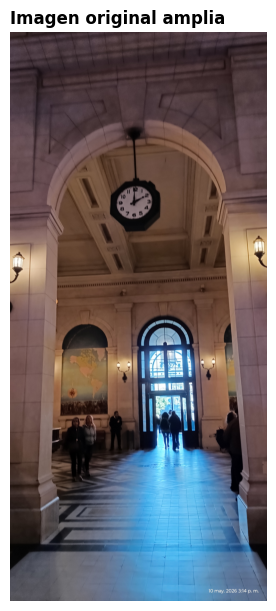

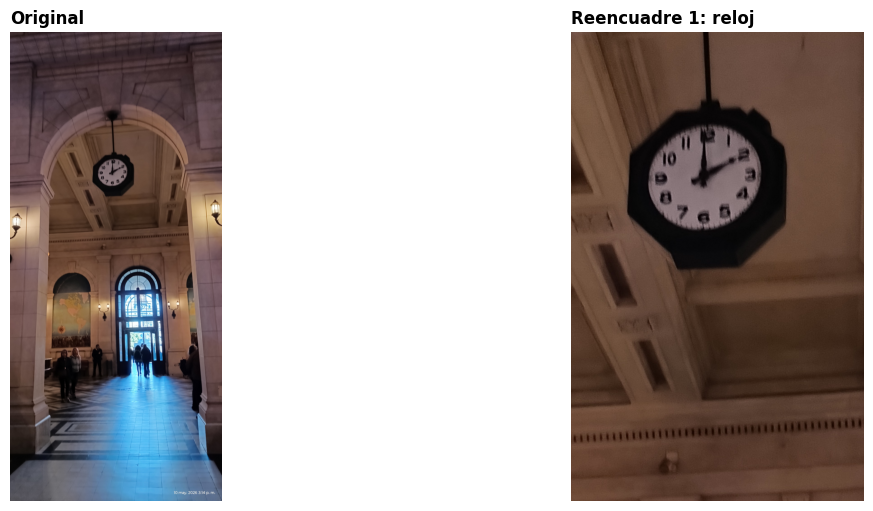

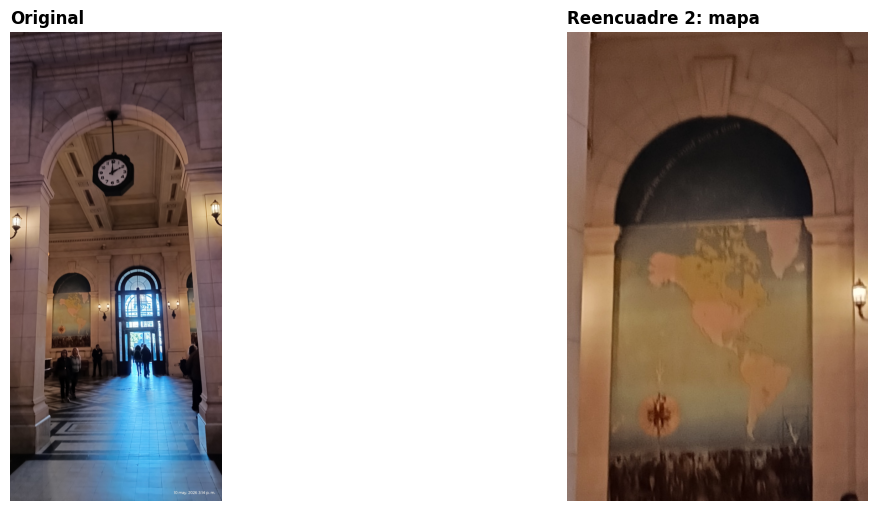

In [21]:
# Imagen original para reencuadre y reinterpretacion
ruta_reenc = carpeta_imagenes_originales / "Reenc.jpg"

# Cargar imagen original
imagen_reenc_rgb = cargar_rgb(ruta_reenc)

# Obtener dimensiones
alto, ancho = imagen_reenc_rgb.shape[:2]

# -----------------------------
# Reencuadre 1: reloj
# -----------------------------
# El reloj pasa a ser el sujeto principal.
# Nota: la variable debería llamarse reencuadre_reloj; fue asignada con el nombre incorrecto.
reencuadre_reloj = imagen_reenc_rgb[
    int(alto * 0.22):int(alto * 0.48),
    int(ancho * 0.32):int(ancho * 0.68)
]


# -----------------------------
# Reencuadre 2: mapa / mural
# -----------------------------
# El mapa del fondo pasa a ser el sujeto principal.
# Esta asignación sobreescribe reencuadre_mapa del bloque anterior.
reencuadre_mapa = imagen_reenc_rgb[
    int(alto * 0.48):int(alto * 0.67),
    int(ancho * 0.16):int(ancho * 0.43)
]


# Mostrar resultados
mostrar_imagen(imagen_reenc_rgb, "Imagen original amplia")

# reencuadre_reloj no fue asignado correctamente en este bloque; esta llamada generará NameError.
mostrar_comparacion(
    imagen_reenc_rgb,
    reencuadre_reloj,
    "Original",
    "Reencuadre 1: reloj"
)

mostrar_comparacion(
    imagen_reenc_rgb,
    reencuadre_mapa,
    "Original",
    "Reencuadre 2: mapa"
)

# Guardar resultados
guardar_rgb(
    carpeta_imagenes_procesadas / "reenc_reencuadre_reloj.png",
    reencuadre_reloj
)

guardar_rgb(
    carpeta_imagenes_procesadas / "reenc_reencuadre_mapa.png",
    reencuadre_mapa
)

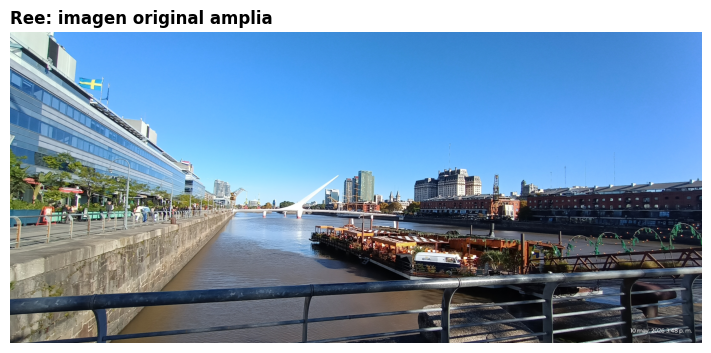

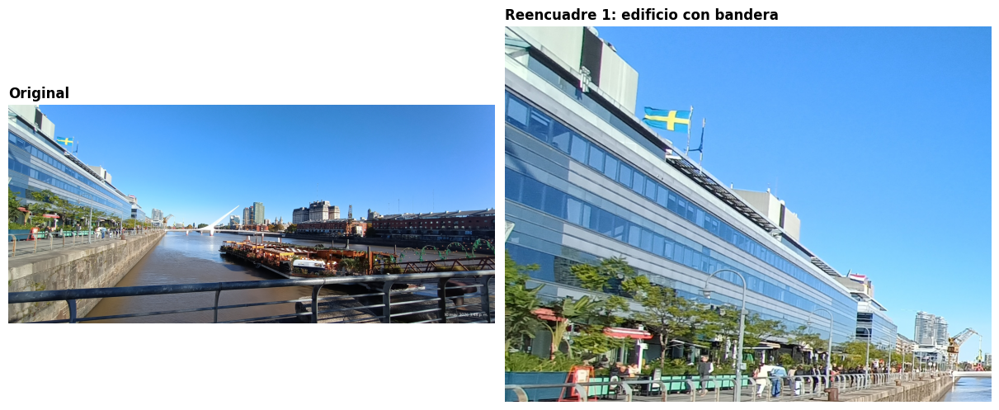

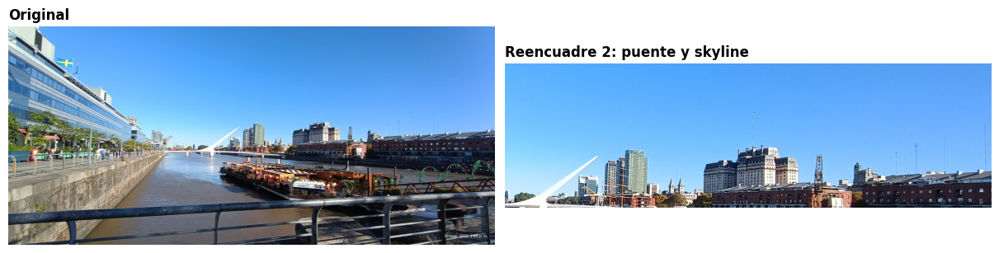

In [22]:
# Imagen original para reencuadre y reinterpretacion
ruta_ree = carpeta_imagenes_originales / "Ree.jpg"

# Cargar imagen original
imagen_ree_rgb = cargar_rgb(ruta_ree)

# Obtener dimensiones
alto, ancho = imagen_ree_rgb.shape[:2]

# -----------------------------
# Reencuadre 1: edificio con bandera
# -----------------------------
# El edificio lateral y la bandera pasan a ser el sujeto principal.
# La imagen deja de leerse como paisaje general y se centra en arquitectura/identidad.
reencuadre_edificio_bandera = imagen_ree_rgb[
    int(alto * 0.02):int(alto * 0.62),
    int(ancho * 0.00):int(ancho * 0.35)
]

# -----------------------------
# Reencuadre 2: puente y skyline
# -----------------------------
# El puente, el río y los edificios del fondo pasan a organizar la imagen.
# La lectura cambia hacia paisaje urbano.
reencuadre_puente_skyline = imagen_ree_rgb[
    int(alto * 0.25):int(alto * 0.58),
    int(ancho * 0.38):int(ancho * 0.88)
]

# Mostrar comparaciones
mostrar_imagen(imagen_ree_rgb, "Ree: imagen original amplia")

mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_edificio_bandera,
    "Original",
    "Reencuadre 1: edificio con bandera"
)

mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_puente_skyline,
    "Original",
    "Reencuadre 2: puente y skyline"
)

# Guardar resultados
guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_edificio_bandera.png",
    reencuadre_edificio_bandera
)

guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_puente_skyline.png",
    reencuadre_puente_skyline
)


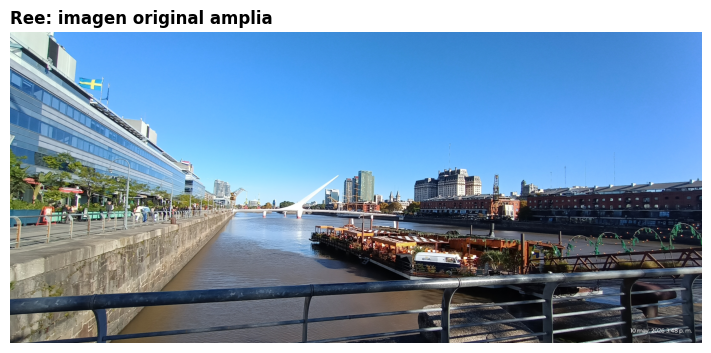

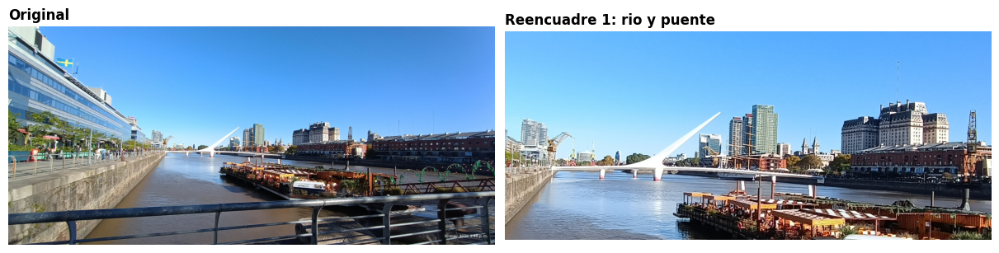

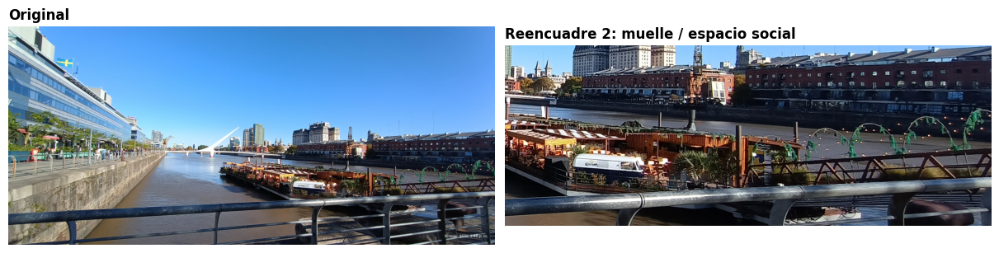

In [23]:
# Imagen original para reencuadre y reinterpretacion
ruta_ree = carpeta_imagenes_originales / "Ree.jpg"

# Cargar imagen original
imagen_ree_rgb = cargar_rgb(ruta_ree)

# Obtener dimensiones
alto, ancho = imagen_ree_rgb.shape[:2]

# -----------------------------
# Reencuadre 1: rio y puente
# -----------------------------
# El recorte transforma la imagen en una escena de recorrido/conexion.
# El puente y el rio pasan a ser los protagonistas.
reencuadre_rio_puente = imagen_ree_rgb[
    int(alto * 0.30):int(alto * 0.72),
    int(ancho * 0.28):int(ancho * 0.72)
]

# -----------------------------
# Reencuadre 2: muelle / espacio social
# -----------------------------
# El recorte cambia la lectura hacia un espacio de encuentro y actividad.
# El muelle con mesas y estructuras pasa a ser el sujeto principal.
reencuadre_muelle_social = imagen_ree_rgb[
    int(alto * 0.48):int(alto * 0.86),
    int(ancho * 0.52):int(ancho * 0.98)
]

# Mostrar imagen original
mostrar_imagen(imagen_ree_rgb, "Ree: imagen original amplia")

# Mostrar comparaciones
mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_rio_puente,
    "Original",
    "Reencuadre 1: rio y puente"
)

mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_muelle_social,
    "Original",
    "Reencuadre 2: muelle / espacio social"
)

# Guardar resultados
guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_rio_puente.png",
    reencuadre_rio_puente
)

guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_muelle_social.png",
    reencuadre_muelle_social
)


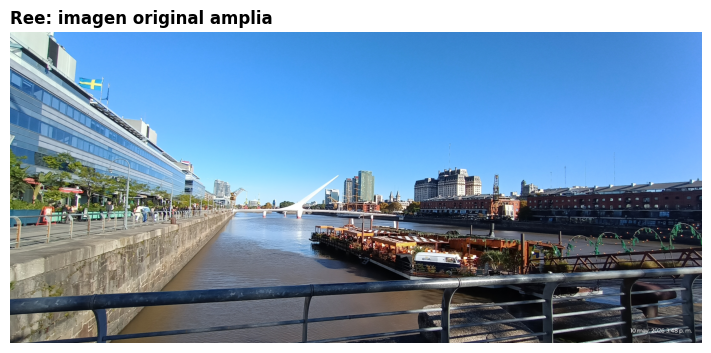

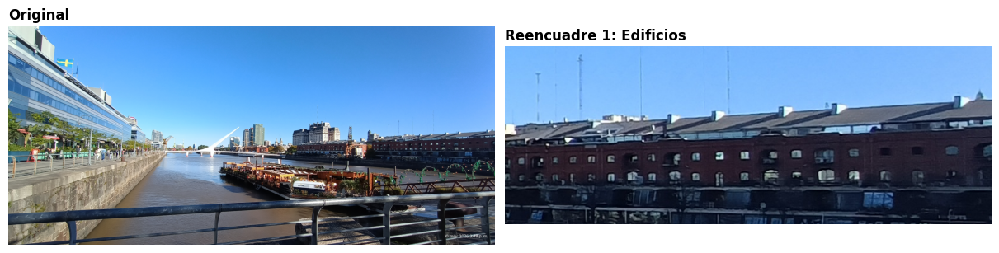

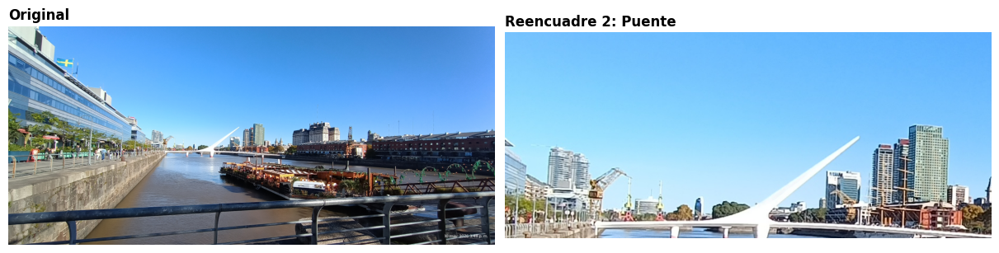

In [24]:
# Imagen original
ruta_ree = carpeta_imagenes_originales / "Ree.jpg"
imagen_ree_rgb = cargar_rgb(ruta_ree)

# -----------------------------
# Reencuadre 1: edificio oscuro horizontal
# -----------------------------
# El sujeto pasa a ser el bloque de edificio en sombra.
# Las coordenadas son píxeles absolutos ajustados visualmente sobre la imagen original.
reencuadre_edificio_oscuro = imagen_ree_rgb[
    620:900,     # y_inicio:y_fin
    2500:3264    # x_inicio:x_fin
]

# -----------------------------
# Reencuadre 2: puente blanco y skyline
# -----------------------------
# El sujeto pasa a ser el puente, el río y la ciudad iluminada.
# Las coordenadas son píxeles absolutos ajustados visualmente sobre la imagen original.
reencuadre_puente_skyline = imagen_ree_rgb[
    480:870,     # y_inicio:y_fin
    880:1800    # x_inicio:x_fin
]

# Mostrar imagen original
mostrar_imagen(imagen_ree_rgb, "Ree: imagen original amplia")

# Mostrar comparaciones
mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_edificio_oscuro,
    "Original",
    "Reencuadre 1: Edificios"
)

mostrar_comparacion(
    imagen_ree_rgb,
    reencuadre_puente_skyline,
    "Original",
    "Reencuadre 2: Puente"
)

# Guardar resultados
guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_edificio_oscuro.png",
    reencuadre_edificio_oscuro
)

guardar_rgb(
    carpeta_imagenes_procesadas / "ree_reencuadre_puente_skyline.png",
    reencuadre_puente_skyline
)

### Reencuadre y reinterpretación  
### Imagen seleccionada: `Ree.jpg`

El objetivo de este ejercicio fue demostrar que cambiar el encuadre modifica el significado de una imagen. Para esto seleccioné `Ree.jpg`, una fotografía amplia de un paisaje urbano junto al río. La imagen contiene varios elementos posibles de lectura: edificios, puente, río, skyline, muelle, cielo y zonas con diferentes niveles de iluminación.

Elegí esta imagen porque permite obtener reencuadres con sentidos claramente distintos. En comparación con `Reenc.jpg`, el resultado es más efectivo, ya que `Ree.jpg` ofrece más variedad visual y espacial. Mientras que en `Reenc.jpg` los posibles recortes quedan concentrados dentro de un mismo interior arquitectónico, en `Ree.jpg` cada reencuadre puede construir una interpretación diferente del lugar: una lectura más cerrada y arquitectónica, o una lectura más abierta y urbana.

Se realizaron dos reencuadres. El primero se centra en el edificio oscuro del fondo. El segundo se centra en el puente blanco, el río y los edificios iluminados.

**Reencuadre 1: edificio oscuro**

Después del crop, se vuelve importante el bloque arquitectónico en sombra. La imagen deja de funcionar como una vista general del paisaje y empieza a leerse como una composición más cerrada, pesada y estática. El edificio ocupa el centro de la atención y los detalles de ventanas, líneas horizontales y zonas oscuras ganan protagonismo.

La información que desaparece es gran parte del río, el puente, el cielo abierto, el muelle y la relación general entre los distintos sectores de la ciudad. El sujeto cambia: en la imagen original el sujeto era el paisaje urbano completo, mientras que en este recorte el sujeto pasa a ser una fachada oscura.

Este reencuadre vuelve la imagen más abstracta, porque reduce el contexto y prioriza formas, sombras y repetición de ventanas.

**Reencuadre 2: puente y skyline**

Después del segundo crop, se vuelven importantes el puente blanco, el río y los edificios del fondo. La imagen cambia hacia una lectura más abierta y luminosa, donde aparece la idea de recorrido, conexión y ciudad.

La información que desaparece es el paseo lateral, buena parte del muelle, la baranda del primer plano y otros elementos que hacían que la imagen original se leyera como una escena amplia del lugar. El sujeto también cambia: ya no es toda la ribera, sino el vínculo visual entre el puente, el agua y el skyline.

Este reencuadre vuelve la imagen más narrativa, porque sugiere una relación entre espacios: el río como recorrido, el puente como conexión y los edificios como destino urbano.

En conclusión, `Ree.jpg` permite demostrar con claridad que el encuadre modifica el significado de una imagen. A partir de una misma fotografía amplia, un recorte puede volver la escena más abstracta y arquitectónica, mientras que otro puede construir una lectura más narrativa y urbana.


## Parte 4. Punto de vista y construcción narrativa

Objetivo
Explorar cómo la posición de la cámara modifica:
●	escala,
●	contexto,
●	relación emocional,
●	información visual.
Requisitos
Fotografiar un mismo sujeto desde:
●	dos puntos de vista distintos.
Uno de ellos debe aportar información contextual nueva.
Ejemplos
●	objeto desde frente y luego cenital,
●	sujeto desde nivel de ojos y luego desde abajo,
●	escena desde lejos y luego desde arriba.
La diapositiva debe incluir
●	vista A,
●	vista B,
●	imagen final elegida,
●	explicación del cambio narrativo.
Preguntas guía
●	¿Qué información aparece desde el nuevo ángulo?
●	¿Cómo cambia la percepción del sujeto?
●	¿Qué relación genera la cámara con la escena?


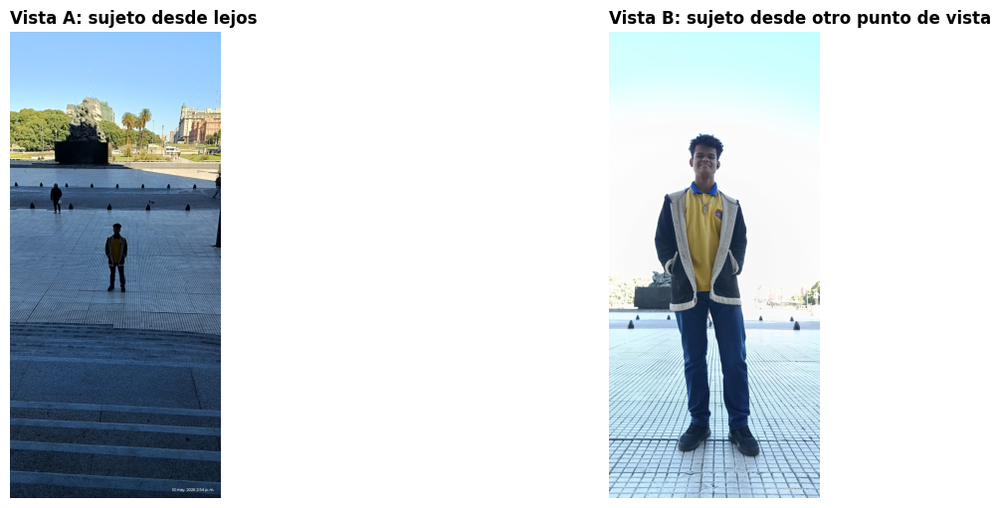

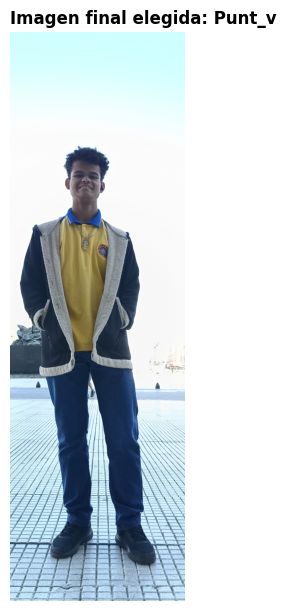

In [25]:
# Imagenes seleccionadas para punto de vista
ruta_punt_a = carpeta_imagenes_originales / "Punt_.jpg"
ruta_punt_b = carpeta_imagenes_originales / "Punt_v.jpg"

# Cargar imagenes
imagen_punt_a = cargar_rgb(ruta_punt_a)
imagen_punt_b = cargar_rgb(ruta_punt_b)

# Mostrar vistas originales
mostrar_comparacion(
    imagen_punt_a,
    imagen_punt_b,
    "Vista A: sujeto desde lejos",
    "Vista B: sujeto desde otro punto de vista"
)

# -----------------------------
# Imagen final elegida
# -----------------------------
# Se elige Punt_v porque muestra al sujeto con mayor presencia
# y permite comparar mejor escala, contexto y relacion con el espacio.
# .copy() evita que el recorte posterior modifique el arreglo original imagen_punt_b
imagen_final_punt = imagen_punt_b.copy()

# Reencuadre leve para centrar el sujeto y reducir bordes innecesarios
alto, ancho = imagen_final_punt.shape[:2]

imagen_final_punt = imagen_final_punt[
    int(alto * 0.03):int(alto * 0.97),
    int(ancho * 0.18):int(ancho * 0.82)
]

# Mostrar imagen final
mostrar_imagen(
    imagen_final_punt,
    "Imagen final elegida: Punt_v"
)

# Guardar vistas y resultado final
guardar_rgb(
    carpeta_imagenes_procesadas / "punto_vista_A_punt.png",
    imagen_punt_a
)

guardar_rgb(
    carpeta_imagenes_procesadas / "punto_vista_B_punt_v.png",
    imagen_punt_b
)

guardar_rgb(
    carpeta_imagenes_procesadas / "punto_vista_final_punt_v.png",
    imagen_final_punt
)

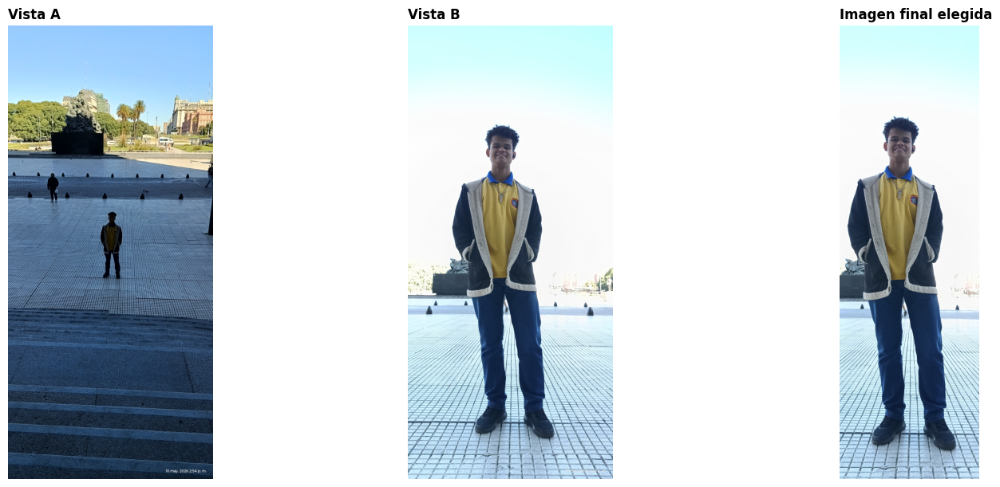

In [26]:
# Visualización de los tres estados en paralelo: Vista A, Vista B e imagen final elegida.
# Permite comparar directamente cómo el punto de vista modifica la escala y la lectura de la escena.
figura, ejes = plt.subplots(1, 3, figsize=(15, 6), constrained_layout=True)

ejes[0].imshow(imagen_punt_a)
ejes[0].set_title("Vista A", fontweight="bold", loc="left")
ejes[0].axis("off")

ejes[1].imshow(imagen_punt_b)
ejes[1].set_title("Vista B", fontweight="bold", loc="left")
ejes[1].axis("off")

ejes[2].imshow(imagen_final_punt)
ejes[2].set_title("Imagen final elegida", fontweight="bold", loc="left")
ejes[2].axis("off")

plt.show()

### Punto de vista  
### Imagen final elegida: `Punt_v.jpg`

El objetivo de este ejercicio fue explorar cómo la posición de la cámara modifica la escala, el contexto, la relación emocional y la información visual de una imagen. Para esto se compararon dos fotografías del mismo sujeto: `Punt_.jpg` y `Punt_v.jpg`.

Seleccioné `Punt_v.jpg` como imagen final porque ofrece un mejor resultado compositivo que `Punt_.jpg`. En `Punt_.jpg`, el sujeto aparece más distante y queda más integrado al entorno, por lo que la atención se reparte entre la figura, el espacio y otros elementos de la escena. En cambio, en `Punt_v.jpg`, el sujeto tiene mayor presencia dentro del encuadre y se percibe con más claridad la relación entre su cuerpo, el piso, la luz y el espacio que lo rodea.

La vista A permite entender el contexto general: el sujeto se encuentra dentro de un espacio amplio y se lo percibe en relación con el entorno. La vista B modifica esa lectura porque cambia la posición de la cámara y la escala del sujeto. El cuerpo gana protagonismo y la imagen se vuelve más directa.

**¿Qué información aparece desde el nuevo ángulo?**

Desde el nuevo punto de vista aparece mejor la relación del sujeto con el espacio. Se perciben con más claridad la superficie del piso, la dirección de la luz, las sombras y la escala del cuerpo en relación con el entorno. Esta información contextual ayuda a comprender mejor dónde está ubicado el sujeto y cómo ocupa el espacio.

**¿Cómo cambia la percepción del sujeto?**

La percepción del sujeto cambia porque en `Punt_v.jpg` aparece más cercano y más importante. Su presencia visual aumenta y deja de ser solo una figura dentro del paisaje. La cámara lo vuelve protagonista y permite observar mejor su postura, su escala y su relación con el lugar.

**¿Qué relación genera la cámara con la escena?**

La cámara genera una relación más cercana y directa con la escena. En lugar de mirar al sujeto desde una distancia más neutral, el nuevo punto de vista produce una sensación de mayor proximidad. Esto modifica la relación emocional: la imagen se vuelve menos descriptiva y más centrada en la experiencia del sujeto dentro del espacio.

En conclusión, el cambio de punto de vista modifica el significado de la imagen. `Punt_.jpg` funciona mejor como registro del contexto, mientras que `Punt_v.jpg` construye una lectura más clara del sujeto, su escala y su presencia dentro de la escena.


## Parte 5. Fotografía basada en la luz

Objetivo
Usar la luz como elemento estructural de la imagen.
Requisitos

Trabajar conscientemente con:

●	dirección de la luz,

●	calidad de la luz,

●	hora del día,

●	contraste,

●	sombras.

Opciones posibles

●	luz frontal,

●	luz lateral,

●	contraluz,

●	hora dorada,

●	hora azul,

●	luz suave,

●	luz dura.

La diapositiva debe incluir

●	fotografía final,

●	pequeño esquema indicando dirección de la luz,

●	explicación breve.

Preguntas guía

●	¿La luz revela o esconde?

●	¿Genera textura?

●	¿Construye atmósfera?

●	¿Cómo cambia el volumen?


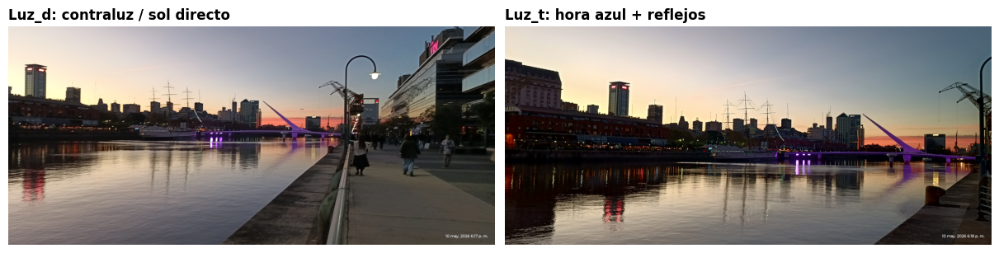

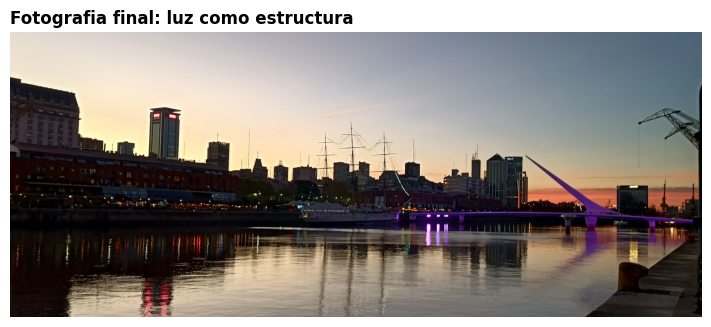

Analisis de luz - Luz_t
Luminosidad promedio: 114.48
Contraste: 79.14


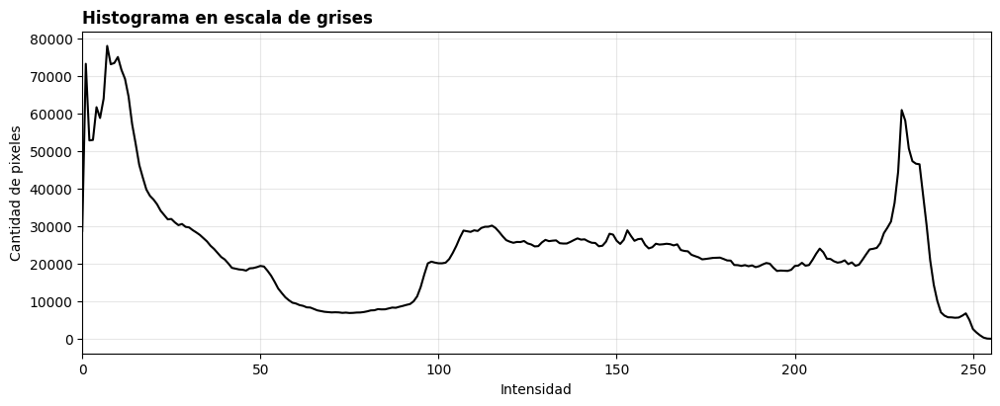

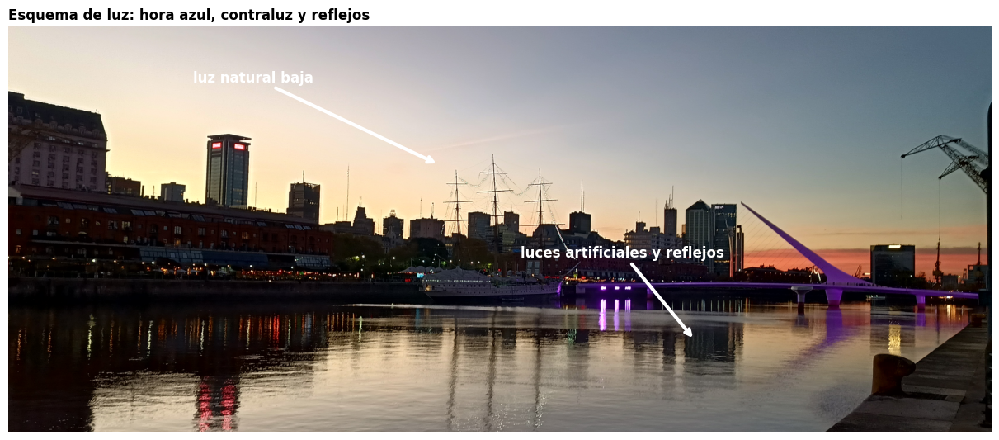

In [27]:
# Fotografias basadas en la luz
rutas_luz = {
    "Luz": carpeta_imagenes_originales / "Luz.jpg",
    "Luz_": carpeta_imagenes_originales / "Luz_.jpg",
    "Luz_d": carpeta_imagenes_originales / "Luz_d.jpg",
    "Luz_t": carpeta_imagenes_originales / "Luz_t.jpg",
}

# Cargar imagenes
imagenes_luz = {
    nombre: cargar_rgb(ruta)
    for nombre, ruta in rutas_luz.items()
}

# Comparar candidatas principales
mostrar_comparacion(
    imagenes_luz["Luz_d"],
    imagenes_luz["Luz_t"],
    "Luz_d: contraluz / sol directo",
    "Luz_t: hora azul + reflejos"
)

# -----------------------------
# Imagen final elegida: Luz_t
# -----------------------------
imagen_luz_final = imagenes_luz["Luz_t"]

alto, ancho = imagen_luz_final.shape[:2]

# Reencuadre leve para eliminar la fecha y concentrar la lectura en cielo, siluetas y reflejos.
imagen_luz_final = imagen_luz_final[
    int(alto * 0.02):int(alto * 0.90),
    int(ancho * 0.02):int(ancho * 0.98)
]

# Mostrar fotografia final
mostrar_imagen(
    imagen_luz_final,
    "Fotografia final: luz como estructura"
)

# Guardar fotografia final
guardar_rgb(
    carpeta_imagenes_procesadas / "luz_t_fotografia_final.png",
    imagen_luz_final
)

# -----------------------------
# Analisis de luz
# -----------------------------
imagen_luz_gris = cv2.cvtColor(imagen_luz_final, cv2.COLOR_RGB2GRAY)

luminosidad_promedio = np.mean(imagen_luz_gris)
contraste = np.std(imagen_luz_gris)

print("Analisis de luz - Luz_t")
print(f"Luminosidad promedio: {luminosidad_promedio:.2f}")
print(f"Contraste: {contraste:.2f}")

mostrar_histograma_gris(imagen_luz_final)

# -----------------------------
# Esquema de direccion de la luz
# -----------------------------
figura, eje = plt.subplots(figsize=(12, 6), constrained_layout=True)

eje.imshow(imagen_luz_final)
eje.axis("off")
eje.set_title(
    "Esquema de luz: hora azul, contraluz y reflejos",
    fontweight="bold",
    loc="left"
)

# Flecha de luz natural baja desde el horizonte
eje.annotate(
    "luz natural baja",
    xy=(int(ancho * 0.42), int(alto * 0.30)),
    xytext=(int(ancho * 0.18), int(alto * 0.12)),
    color="white",
    fontsize=12,
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="white",
        linewidth=3
    )
)

# Flecha de luces artificiales hacia el agua
eje.annotate(
    "luces artificiales y reflejos",
    xy=(int(ancho * 0.67), int(alto * 0.68)),
    xytext=(int(ancho * 0.50), int(alto * 0.50)),
    color="white",
    fontsize=12,
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="white",
        linewidth=3
    )
)

plt.savefig(
    carpeta_imagenes_procesadas / "luz_t_esquema_direccion_luz.png",
    dpi=150,
    bbox_inches="tight"
)

plt.show()


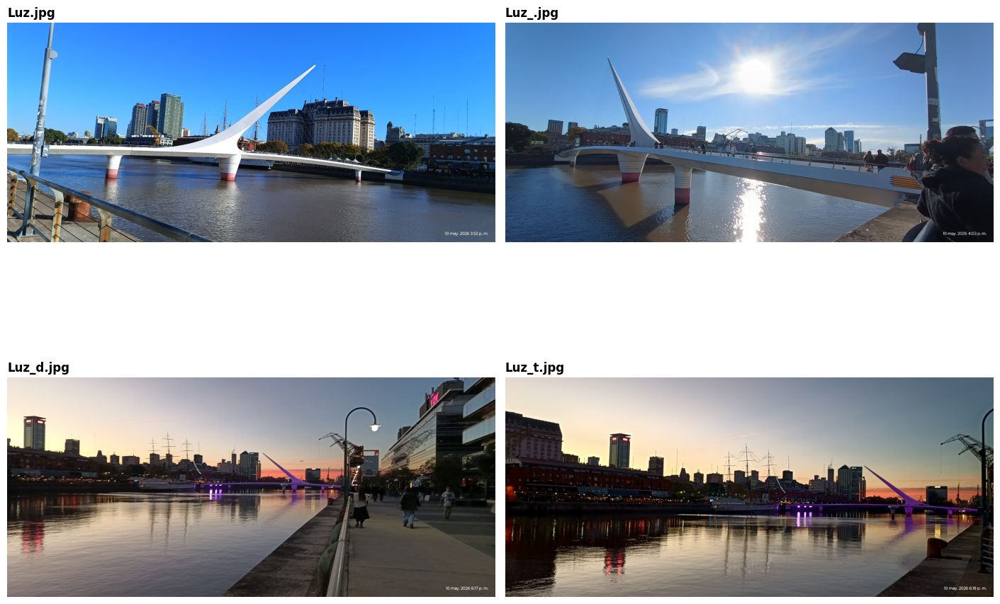

,imagen,luminosidad_promedio,contraste,valor_minimo,valor_maximo
0,Luz.jpg,113.952571,51.288761,0,255
1,Luz_.jpg,119.886340,57.667604,1,255
2,Luz_d.jpg,109.533110,68.502732,0,255
3,Luz_t.jpg,110.971630,76.641912,0,255


In [28]:
# Fotografias basadas en la luz
rutas_luz = {
    "Luz.jpg": carpeta_imagenes_originales / "Luz.jpg",
    "Luz_.jpg": carpeta_imagenes_originales / "Luz_.jpg",
    "Luz_d.jpg": carpeta_imagenes_originales / "Luz_d.jpg",
    "Luz_t.jpg": carpeta_imagenes_originales / "Luz_t.jpg",
}

# Cargar imagenes
imagenes_luz = {
    nombre: cargar_rgb(ruta)
    for nombre, ruta in rutas_luz.items()
}

# -----------------------------
# Comparacion visual general
# -----------------------------
figura, ejes = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)

for eje, (nombre, imagen) in zip(ejes.flat, imagenes_luz.items()):
    eje.imshow(imagen)
    eje.set_title(nombre, fontweight="bold", loc="left")
    eje.axis("off")

plt.show()

# -----------------------------
# Analisis numerico de luz
# -----------------------------
# luminosidad_promedio: media de las intensidades en grises (mayor valor = imagen más brillante)
# contraste: desviación estándar (mayor valor = mayor diferencia entre zonas claras y oscuras)
# valor_minimo / valor_maximo: rango efectivo; si llega a 0 y 255 indica uso completo del rango
analisis_luz = []

for nombre, imagen in imagenes_luz.items():
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)

    luminosidad_promedio = np.mean(imagen_gris)
    contraste = np.std(imagen_gris)
    valor_minimo = np.min(imagen_gris)
    valor_maximo = np.max(imagen_gris)

    analisis_luz.append({
        "imagen": nombre,
        "luminosidad_promedio": luminosidad_promedio,
        "contraste": contraste,
        "valor_minimo": valor_minimo,
        "valor_maximo": valor_maximo
    })

tabla_luz = pd.DataFrame(analisis_luz)
tabla_luz

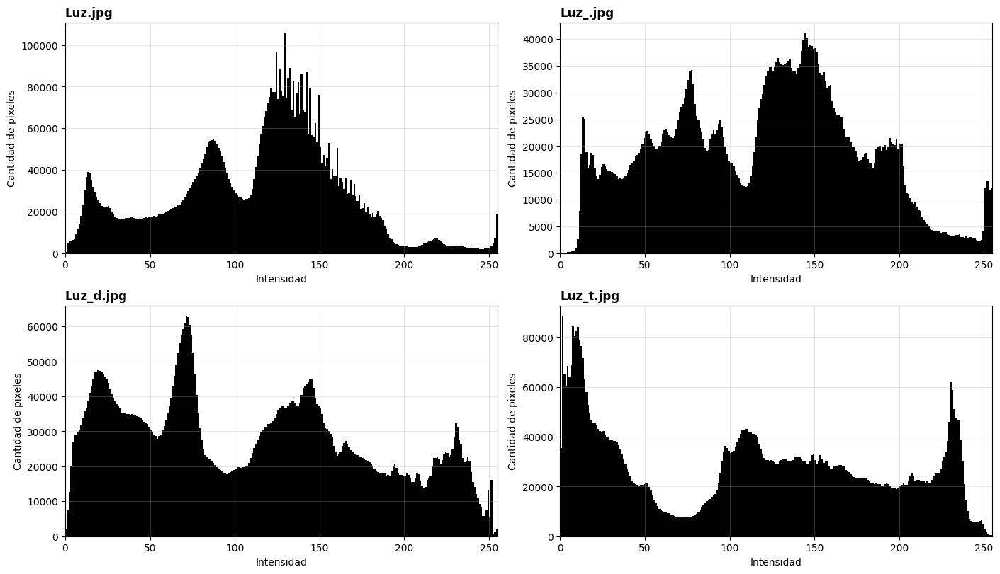

In [29]:
# -----------------------------
# Histogramas comparativos
# -----------------------------
# Se busca observar: si el histograma está concentrado (bajo contraste) o distribuido (alto contraste),
# y si hay acumulación en los extremos izquierdo (subexposición) o derecho (sobreexposición).
figura, ejes = plt.subplots(2, 2, figsize=(14, 8), constrained_layout=True)

for eje, (nombre, imagen) in zip(ejes.flat, imagenes_luz.items()):
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)

    eje.hist(imagen_gris.flatten(), bins=256, range=[0, 256], color="black")
    eje.set_title(nombre, fontweight="bold", loc="left")
    eje.set_xlim(0, 255)
    eje.set_xlabel("Intensidad")
    eje.set_ylabel("Cantidad de pixeles")
    eje.grid(alpha=0.3)

plt.show()

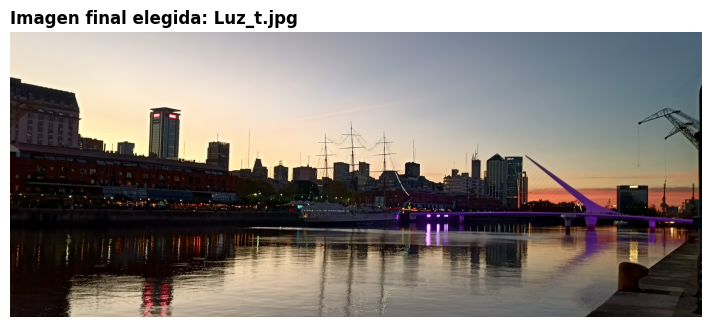

In [30]:
# -----------------------------
# Seleccion de imagen final
# -----------------------------
# Se elige Luz_t.jpg porque la luz organiza mejor la imagen:
# combina hora azul/dorada, siluetas, contraste, luces artificiales y reflejos.

imagen_luz_final = imagenes_luz["Luz_t.jpg"]

alto, ancho = imagen_luz_final.shape[:2]

# Reencuadre leve para eliminar la fecha y concentrar la atencion en luz, cielo y reflejos
imagen_luz_final = imagen_luz_final[
    int(alto * 0.02):int(alto * 0.90),
    int(ancho * 0.02):int(ancho * 0.98)
]

mostrar_imagen(
    imagen_luz_final,
    "Imagen final elegida: Luz_t.jpg"
)

guardar_rgb(
    carpeta_imagenes_procesadas / "luz_t_fotografia_final.png",
    imagen_luz_final
)


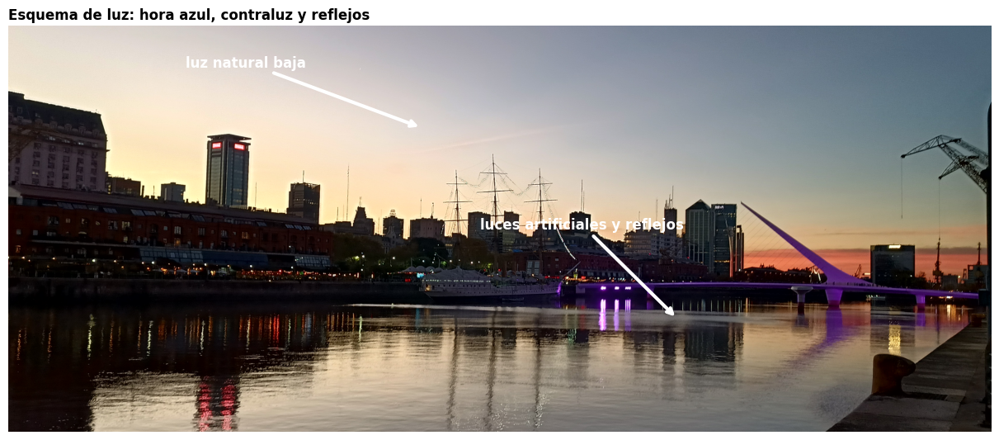

In [31]:
# -----------------------------
# Esquema de direccion de la luz
# -----------------------------
# Se recalculan las dimensiones porque imagen_luz_final fue recortada en la celda anterior.
alto_final, ancho_final = imagen_luz_final.shape[:2]

figura, eje = plt.subplots(figsize=(12, 6), constrained_layout=True)

eje.imshow(imagen_luz_final)
eje.axis("off")
eje.set_title(
    "Esquema de luz: hora azul, contraluz y reflejos",
    fontweight="bold",
    loc="left"
)

# xy: posición de la punta de la flecha (punto de interés en la imagen)
# xytext: posición del texto y origen visual de la flecha
# Luz natural desde el horizonte
eje.annotate(
    "luz natural baja",
    xy=(int(ancho_final * 0.42), int(alto_final * 0.25)),
    xytext=(int(ancho_final * 0.18), int(alto_final * 0.10)),
    color="white",
    fontsize=12,
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="white",
        linewidth=3
    )
)

# Luces artificiales y reflejos en el agua
eje.annotate(
    "luces artificiales y reflejos",
    xy=(int(ancho_final * 0.68), int(alto_final * 0.72)),
    xytext=(int(ancho_final * 0.48), int(alto_final * 0.50)),
    color="white",
    fontsize=12,
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="white",
        linewidth=3
    )
)

plt.savefig(
    carpeta_imagenes_procesadas / "luz_t_esquema_direccion_luz.png",
    dpi=150,
    bbox_inches="tight"
)

plt.show()

### Fotografía basada en la luz  
### Imagen seleccionada: `Luz_t.jpg`

El objetivo de este ejercicio fue usar la luz como elemento estructural de la imagen. Para esto se compararon las fotografías cuyo nombre comienza con `Luz`, observando dirección de la luz, contraste, sombras, hora del día y atmósfera general.

La imagen seleccionada fue `Luz_t.jpg` porque es la que mejor organiza la escena a partir de la luz. A diferencia de las imágenes tomadas con luz diurna fuerte, donde la luz funciona principalmente como iluminación general, en `Luz_t.jpg` la luz construye el sentido de la imagen: aparece una mezcla entre luz natural baja, hora azul/dorada, luces artificiales y reflejos sobre el agua.

La dirección principal de la luz proviene del horizonte, desde el fondo de la escena. Esta posición genera un efecto de contraluz parcial: los edificios, personas y estructuras aparecen más oscuros, mientras que el cielo y los reflejos conservan mayor luminosidad. Además, las luces artificiales del puente y del paseo refuerzan la composición mediante puntos de color y reflejos verticales en el agua.

La calidad de la luz es suave en el cielo, porque corresponde a un momento cercano al atardecer. Sin embargo, el contraste entre las zonas iluminadas y las siluetas oscuras genera una lectura más dramática. La hora del día es importante porque permite combinar luz natural y luz artificial, creando una atmósfera urbana nocturna o de transición.

**¿La luz revela o esconde?**

La luz revela principalmente el cielo, el agua y los reflejos. Al mismo tiempo, esconde parte de los detalles de los edificios y de las personas, que quedan más cercanos a la silueta. Esto hace que la imagen se lea menos por detalle y más por formas generales, contraste y atmósfera.

**¿Genera textura?**

Sí. La luz genera textura especialmente en el agua, donde los reflejos se fragmentan y producen líneas verticales. También aparece textura en el cielo por la transición suave de color y luminosidad.

**¿Construye atmósfera?**

Sí. La combinación de hora azul, tonos cálidos del horizonte, luces artificiales y reflejos construye una atmósfera tranquila, urbana y contemplativa. La escena no depende solo del lugar fotografiado, sino del momento lumínico en que fue tomada.

**¿Cómo cambia el volumen?**

El volumen cambia porque las estructuras oscuras se simplifican como siluetas, mientras que las zonas iluminadas ganan presencia. La luz separa planos: fondo luminoso, edificios en sombra, puente iluminado y reflejos en el agua. Esto produce profundidad y organiza visualmente la imagen.

En conclusión, `Luz_t.jpg` fue seleccionada porque la luz no solo ilumina la escena, sino que define su composición, su contraste y su clima visual.
